In [1]:
import torch
import torch.nn as nn
from torchvision import models
import torchxrayvision as xrv
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
from pytorch_grad_cam import EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import sys
import os

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..")))
from util.PNGDatasetNormalized import PNGFolderDataset

## Support Function

### Data Loader

In [2]:
def find_confusion_matrix_indices(dataset, model, target_class="Cardiomegaly", threshold=0.5, limit=5, max_scan=2000):
    """
    Scans the dataset to find indices for TP, TN, FP, FN.
    FIXED: Now dynamically handles 'target_class' for numeric columns (Edema, Consolidation, etc.)
    instead of being hardcoded to 'Cardiomegaly'.
    """
    
    results = {
        'TP': [], # True Positive
        'TN': [], # True Negative
        'FP': [], # False Positive (Type I Error)
        'FN': []  # False Negative (Type II Error)
    }
    
    model.eval()
    device = next(model.parameters()).device
    
    print(f"Scanning up to {max_scan} images to find {limit} examples per category for '{target_class}'...")
    
    if not hasattr(dataset, 'csv'):
        print("Error: Dataset does not have a .csv attribute.")
        return results
        
    if target_class in dataset.csv.columns:
        col_name = target_class
    elif 'Finding Labels' in dataset.csv.columns:
        col_name = 'Finding Labels'
    elif 'Cardiomegaly' in dataset.csv.columns:
        col_name = 'Cardiomegaly'
    else:
        print(f"Error: Could not find '{target_class}' or 'Finding Labels' column.")
        return results
    
    print(f"Using column: '{col_name}' for Ground Truth.")

    for index in tqdm(range(len(dataset))):
        if index >= max_scan:
            break
            
        if all(len(v) >= limit for v in results.values()):
            print("Found enough examples for all categories!")
            break

        label_val = dataset.csv.iloc[index][col_name]
        
        if col_name == target_class:
            if pd.isna(label_val): continue
            gt = int(label_val)
            
        else:
            if isinstance(target_class, list):
                gt = 1 if any(t in str(label_val) for t in target_class) else 0
            else:
                gt = 1 if target_class in str(label_val) else 0

        try:
            sample = dataset[index]
            img_xrv = sample['img']
            
            img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
            if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)
            
            input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

            with torch.no_grad():
                output = model(input_tensor)
                prob = torch.sigmoid(output).item()
            
            pred = 1 if prob > threshold else 0
            
            if gt == 1 and pred == 1:
                if len(results['TP']) < limit: results['TP'].append(index)
            elif gt == 0 and pred == 0:
                if len(results['TN']) < limit: results['TN'].append(index)
            elif gt == 0 and pred == 1:
                if len(results['FP']) < limit: results['FP'].append(index)
            elif gt == 1 and pred == 0:
                if len(results['FN']) < limit: results['FN'].append(index)

        except Exception as e:
            continue

    # Summary Print
    print("\n--- Scanning Complete ---")
    print(f"TP (True Pos):  {results['TP']}")
    print(f"TN (True Neg):  {results['TN']}")
    print(f"FP (False Pos): {results['FP']}")
    print(f"FN (False Neg): {results['FN']}")
    
    return results

In [3]:
def find_random_confusion_matrix_indices(dataset, model, target_class="Cardiomegaly", threshold=0.5, limit=50, max_scan=2000):
    """
    Scans RANDOM INDICES in the dataset to find diverse examples for TP, TN, FP, FN.
    FIXED: Dynamically checks multiple column types per row for Merged Datasets.
    """
    
    results = {
        'TP': [], # True Positive
        'TN': [], # True Negative
        'FP': [], # False Positive (Type I Error)
        'FN': []  # False Negative (Type II Error)
    }
    
    model.eval()
    device = next(model.parameters()).device
    
    # Random Selection
    total_images = len(dataset)
    actual_scan_limit = min(total_images, max_scan)
    print(f"Selecting {actual_scan_limit} RANDOM indices from {total_images} total images...")
    random_indices = np.random.choice(total_images, size=actual_scan_limit, replace=False)

    print(f"Scanning to find {limit} examples per category...")
    
    if not hasattr(dataset, 'csv'):
        print("Error: Dataset does not have a .csv attribute.")
        return results

    has_finding_labels = 'Finding Labels' in dataset.csv.columns
    has_target_col = target_class in dataset.csv.columns

    for index in tqdm(random_indices):
        
        if all(len(v) >= limit for v in results.values()):
            print("Found enough examples for all categories!")
            break

        gt = None
        
        if has_target_col:
            val = dataset.csv.iloc[index][target_class]
            if not pd.isna(val):
                gt = int(val)
        
        if gt is None and has_finding_labels:
            val = dataset.csv.iloc[index]['Finding Labels']
            if not pd.isna(val):
                if isinstance(target_class, list):
                    gt = 1 if any(t in str(val) for t in target_class) else 0
                else:
                    gt = 1 if target_class in str(val) else 0

        if gt is None:
            continue

        try:
            sample = dataset[index]
            img_xrv = sample['img']
            
            img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
            if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)
            
            input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

            with torch.no_grad():
                output = model(input_tensor)
                prob = torch.sigmoid(output).item()
            
            pred = 1 if prob > threshold else 0
            
            if gt == 1 and pred == 1:
                if len(results['TP']) < limit: results['TP'].append(index)
            elif gt == 0 and pred == 0:
                if len(results['TN']) < limit: results['TN'].append(index)
            elif gt == 0 and pred == 1:
                if len(results['FP']) < limit: results['FP'].append(index)
            elif gt == 1 and pred == 0:
                if len(results['FN']) < limit: results['FN'].append(index)

        except Exception as e:
            continue

    # Summary Print
    print("\n--- Scanning Complete ---")
    print(f"TP: {len(results['TP'])} found")
    print(f"TN: {len(results['TN'])} found")
    print(f"FP: {len(results['FP'])} found")
    print(f"FN: {len(results['FN'])} found")
    
    return results

In [4]:
def find_tp_fp_indices(dataset, model, target_class="Cardiomegaly", threshold=0.5, limit=50, max_scan=2000):
    """
    Scans RANDOM INDICES to find ONLY True Positives (TP) and False Positives (FP).
    Optimized to skip inference if the specific category quota is already met.
    """
    
    results = {
        'TP': [], # True Positive (GT=1, Pred=1)
        'FP': []  # False Positive (GT=0, Pred=1)
    }
    
    model.eval()
    device = next(model.parameters()).device
    
    # Random Selection
    total_images = len(dataset)
    actual_scan_limit = min(total_images, max_scan)
    print(f"Selecting {actual_scan_limit} RANDOM indices from {total_images} total images...")
    random_indices = np.random.choice(total_images, size=actual_scan_limit, replace=False)

    print(f"Scanning to find {limit} examples for TP and FP...")
    
    if not hasattr(dataset, 'csv'):
        print("Error: Dataset does not have a .csv attribute.")
        return results

    # Pre-check available columns to avoid repeated lookups
    has_finding_labels = 'Finding Labels' in dataset.csv.columns
    has_target_col = target_class in dataset.csv.columns

    for index in tqdm(random_indices):
        
        # STOP CONDITION: Break only if BOTH TP and FP are full
        if len(results['TP']) >= limit and len(results['FP']) >= limit:
            print("Found enough examples for both TP and FP!")
            break

        # --- 1. DYNAMIC GROUND TRUTH ---
        gt = None
        
        # Priority A: Check if specific target column exists (PadChest/CheXpert style)
        if has_target_col:
            val = dataset.csv.iloc[index][target_class]
            if not pd.isna(val):
                gt = int(val)
        
        # Priority B: If A failed, check 'Finding Labels' (NIH style)
        if gt is None and has_finding_labels:
            val = dataset.csv.iloc[index]['Finding Labels']
            if not pd.isna(val):
                if isinstance(target_class, list):
                    gt = 1 if any(t in str(val) for t in target_class) else 0
                else:
                    gt = 1 if target_class in str(val) else 0

        # If we still don't have a GT (both columns were NaN), skip this image
        if gt is None:
            continue

        # --- OPTIMIZATION: Skip Inference if Quota Full ---
        # If Ground Truth is 1, this can ONLY become a TP (or FN). 
        # If we already have enough TPs, we don't need to run the model.
        if gt == 1 and len(results['TP']) >= limit:
            continue
            
        # If Ground Truth is 0, this can ONLY become a FP (or TN).
        # If we already have enough FPs, we don't need to run the model.
        if gt == 0 and len(results['FP']) >= limit:
            continue

        # --- 2. Load & Preprocess Image ---
        try:
            sample = dataset[index]
            img_xrv = sample['img']
            
            # Normalize [0, 1]
            img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
            if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)
            
            # Create Input Tensor
            input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

            # --- 3. Inference ---
            with torch.no_grad():
                output = model(input_tensor)
                prob = torch.sigmoid(output).item()
            
            # --- 4. Categorize ---
            # We ONLY care if the model predicts Positive (prob > threshold)
            if prob > threshold:
                pred = 1
                if gt == 1:
                    results['TP'].append(index)
                elif gt == 0:
                    results['FP'].append(index)
            
            # We implicitly ignore:
            # - FN (gt=1, pred=0) -> Model missed it
            # - TN (gt=0, pred=0) -> Model correctly ignored it

        except Exception as e:
            continue

    # Summary Print
    print("\n--- Scanning Complete ---")
    print(f"TP (True Pos):  {len(results['TP'])} found")
    print(f"FP (False Pos): {len(results['FP'])} found")
    
    return results

In [5]:
class XRVCorrectionDataset(torch.utils.data.Dataset):
    """
    Wraps standard XRV datasets (range -1024 to 1024) and 
    rescales them to [0, 1] to match PNGFolderDataset.
    Exposes essential attributes for MergeDataset.
    """
    def __init__(self, dataset):
        self.dataset = dataset
        if hasattr(dataset, 'csv'): self.csv = dataset.csv
        if hasattr(dataset, 'pathologies'): self.pathologies = dataset.pathologies
        if hasattr(dataset, 'labels'): self.labels = dataset.labels 
        
    def __len__(self):
        return len(self.dataset)
        
    def __getitem__(self, idx):
        sample = self.dataset[idx]
        img = sample['img']
        # Rescale [-1024, 1024] -> [0, 1]
        img = (img + 1024) / 2048.0
        img = np.clip(img, 0, 1)
        if img.ndim == 2: img = np.expand_dims(img, 0)
        sample['img'] = img
        return sample

### SHAP

In [6]:
def f(x):
    # x is a numpy array from SHAP: (Batch, H, W, C)
    # We need to convert it back to Tensor (Batch, C, H, W) for the model
    
    # 1. Convert to Tensor
    tmp = torch.from_numpy(x).float()
    
    # 2. Rearrange to (Batch, Channels, H, W)
    tmp = tmp.permute(0, 3, 1, 2)
    
    # 3. Handle Normalization 
    # (If your model was trained on ImageNet stats, you might need to normalize here.
    # Since you used XRV data, we assume the input [0,1] is roughly fine or 
    # you can re-apply specific mean/std here if your training used it.)
    
    if torch.cuda.is_available():
        tmp = tmp.cuda()
    
    with torch.no_grad():
        output = model(tmp)
        # Use Sigmoid for binary classification (Atelectasis Yes/No)
        # Use Softmax if you have 2+ output neurons
        return torch.sigmoid(output).cpu().numpy()

In [7]:
from scipy.ndimage import gaussian_filter
from matplotlib.colors import LinearSegmentedColormap

def save_shap_positive_only(index, dataset, model, explainer, sigma=2, save_path=None, target_class="Cardiomegaly"):
    """
    Computes SHAP for a single image with ROBUST Ground Truth logic.
    """
    
    # 1. Load Data
    sample = dataset[index]
    img = sample['img']
    
    # --- ROBUST GROUND TRUTH LOGIC ---
    gt_text = "Unknown"
    is_positive = False

    if hasattr(dataset, 'csv'):
        if target_class in dataset.csv.columns:
            val = dataset.csv.iloc[index][target_class]
            if not np.isnan(val):
                is_positive = (int(val) == 1)
                gt_text = "Positive" if is_positive else "Negative"
                
        elif 'Finding Labels' in dataset.csv.columns:
            label_text = dataset.csv.iloc[index]['Finding Labels']
            is_positive = target_class in label_text
            gt_text = "Positive" if is_positive else "Negative"

    if isinstance(img, torch.Tensor):
        img = img.numpy()
        
    img_stretched = (img - img.min()) / (img.max() - img.min())
    
    img_tensor = torch.from_numpy(img_stretched).float()
    if img_tensor.dim() == 2: img_tensor = img_tensor.unsqueeze(0)
    if img_tensor.shape[0] == 1: img_tensor = img_tensor.repeat(3, 1, 1)

    input_tensor = img_tensor.unsqueeze(0).to(next(model.parameters()).device)
    
    model.eval()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.sigmoid(output).item()
    
    if prob < 0.5: pred_text = f"Negative ({prob:.2%})"
    else: pred_text = f"Positive ({prob:.2%})"

    print(f"Calculating SHAP for Index {index}...")
    shap_values = explainer.shap_values(input_tensor)
    
    sv = shap_values
    if isinstance(sv, list): sv = sv[0]
    sv = np.squeeze(sv)
    if sv.ndim == 3 and sv.shape[0] == 3: sv = np.transpose(sv, (1, 2, 0))

    img_numpy = input_tensor.squeeze(0).cpu().numpy()
    img_numpy = np.transpose(img_numpy, (1, 2, 0))
    
    norm_image_uint8 = (img_numpy[:, :, 0] * 255).astype(np.uint8)
    _, binary_mask = cv2.threshold(norm_image_uint8, 15, 255, cv2.THRESH_BINARY)
    
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        filled_mask = np.zeros_like(binary_mask)
        cv2.drawContours(filled_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
        mask = filled_mask.astype(np.float32) / 255.0
    else:
        mask = np.ones_like(binary_mask).astype(np.float32)
        
    mask_3d = mask[:, :, np.newaxis]
    sv_masked = sv * mask_3d
    
    # 1. Sum to 2D before smoothing and coloring
    if sv_masked.ndim == 3:
        sv_masked = np.sum(sv_masked, axis=2)

    sv_masked = np.maximum(sv_masked, 0) 

    # 2. Smooth (sigma is now just a single number for 2D)
    if sigma > 0:
        sv_masked = gaussian_filter(sv_masked, sigma=sigma)

    # 3. Normalize to [0, 1]
    if sv_masked.max() > 0:
        sv_norm = (sv_masked - sv_masked.min()) / (sv_masked.max() - sv_masked.min())
    else:
        sv_norm = sv_masked

    # 4. Create MANUAL INFERNO Overlay & Blend
    cmap = plt.get_cmap('inferno')
    shap_heatmap = cmap(sv_norm)[:, :, :3]
    
    alpha = 0.8  
    shap_viz = (1 - alpha) * img_numpy + alpha * shap_heatmap
    shap_viz = np.clip(shap_viz, 0, 1)
    
    # 5. Manual Plotting (No shap.image_plot)
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    
    # Left Image: Original X-Ray
    axes[0].imshow(img_numpy)
    axes[0].set_title(f"Ground Truth:\n{gt_text}", fontsize=25, color='green' if gt_text=="Positive" else 'black')
    axes[0].axis('off')
    
    # Right Image: SHAP Overlay
    axes[1].imshow(shap_viz)
    axes[1].set_title(f"Prediction:\n{pred_text}", fontsize=25, color='red' if prob > 0.5 else 'blue')
    axes[1].axis('off')

    plt.subplots_adjust(wspace=0.05)

    if save_path:
        print(f"Saving to {save_path}...")
        plt.savefig(save_path, bbox_inches='tight', pad_inches=0.1, dpi=300)
    
    plt.show()

In [8]:
from scipy.ndimage import gaussian_filter
from mpl_toolkits.axes_grid1 import make_axes_locatable

def generate_population_shap(indices, dataset, model, explainer, max_images=50, sigma=2, save_path=None):
    """
    Computes Global SHAP using a 1x4 Grid Layout to ensure all images stay the exact same size.
    """
    print(f"Generating Smoothed Global SHAP Map for {min(len(indices), max_images)} images...")
    
    cumulative_shap = None
    cumulative_img = None
    count = 0
    
    process_indices = indices[:max_images]
    
    for idx in tqdm(process_indices):
        try:
            # Load & Preprocess
            sample = dataset[idx]
            img = sample['img']
            
            if isinstance(img, torch.Tensor): img = img.numpy()
            img_stretched = (img - img.min()) / (img.max() - img.min())
            
            img_tensor = torch.from_numpy(img_stretched).float()
            if img_tensor.dim() == 2: img_tensor = img_tensor.unsqueeze(0)
            if img_tensor.shape[0] == 1: img_tensor = img_tensor.repeat(3, 1, 1)
            input_tensor = img_tensor.unsqueeze(0).to(next(model.parameters()).device)
            
            # SHAP
            shap_values = explainer.shap_values(input_tensor)
            
            # Dimensions
            sv = shap_values
            if isinstance(sv, list): sv = sv[0]
            sv = np.squeeze(sv)
            if sv.ndim == 3 and sv.shape[0] == 3: 
                sv = np.transpose(sv, (1, 2, 0))
            
            img_numpy = input_tensor.squeeze(0).cpu().numpy()
            img_numpy = np.transpose(img_numpy, (1, 2, 0))
            
            if cumulative_shap is None:
                cumulative_shap = np.zeros_like(sv)
                cumulative_img = np.zeros_like(img_numpy)
            
            cumulative_shap += sv
            cumulative_img += img_numpy
            count += 1
            
        except Exception as e:
            continue

    if count == 0:
        print("No images processed.")
        return

    avg_shap = cumulative_shap / count
    avg_img = cumulative_img / count
    avg_img = (avg_img - avg_img.min()) / (avg_img.max() - avg_img.min())
    
    avg_shap_2d = np.sum(avg_shap, axis=2)
    avg_shap_pos = np.maximum(avg_shap_2d, 0)
    
    if sigma > 0:
        print(f"Applying Gaussian Smoothing (sigma={sigma})...")
        avg_shap_pos = gaussian_filter(avg_shap_pos, sigma=sigma)
    
    fig, axes = plt.subplots(1, 4, figsize=(20, 6), gridspec_kw={'width_ratios': [1, 1, 1, 0.05]})
    
    # A. Average Patient (Left)
    axes[0].imshow(avg_img)
    axes[0].set_title(f"Average Patient (N={count})", fontsize=14, weight='bold')
    axes[0].axis('off')
    
    # B. Population Overlay (Middle)
    axes[1].imshow(avg_img, cmap='gray')
    axes[1].imshow(avg_shap_pos, cmap='inferno', alpha=0.6) 
    axes[1].set_title("Population Overlay", fontsize=14, weight='bold')
    axes[1].axis('off')

    # C. Global Heatmap (Right)
    im = axes[2].imshow(avg_shap_pos, cmap='inferno')
    axes[2].set_title("Global SHAP Importance", fontsize=14, weight='bold')
    axes[2].axis('off')

    # D. Colorbar (Far Right - Dedicated Axis)
    cbar = plt.colorbar(im, cax=axes[3])
    
    plt.subplots_adjust(wspace=0.1)
    
    if save_path:
        print(f"Saving to {save_path}...")
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
    
    plt.show()

# Cardiomegaly

In [9]:
d_nih_raw = xrv.datasets.NIH_Dataset(
    imgpath="/home/varrel/imaging/all_images/NIH_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/nih_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_test = XRVCorrectionDataset(d_nih_raw)

### Swin-B - CAM

In [10]:
# Load the model
weights = models.Swin_B_Weights.IMAGENET1K_V1
model = models.swin_b(weights=weights)
model.head = nn.Linear(model.head.in_features, 1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = "/home/varrel/image_model_dict/final/fixed_swinb_cardiomegaly_model_epoch5.pth"
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

if 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
else:
    model.load_state_dict(checkpoint)

model = model.to(device)
model.eval()

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=512, out_features=128, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock

In [11]:
indices_dict = find_confusion_matrix_indices(d_nih_test, model, threshold=0.587, limit=5)

Scanning up to 2000 images to find 5 examples per category for 'Cardiomegaly'...
Using column: 'Finding Labels' for Ground Truth.


  3%|▎         | 314/11061 [00:02<01:31, 117.39it/s]

Found enough examples for all categories!

--- Scanning Complete ---
TP (True Pos):  [0, 30, 53, 100, 248]
TN (True Neg):  [2, 3, 5, 6, 8]
FP (False Pos): [48, 50, 249, 265, 313]
FN (False Neg): [1, 4, 7, 21, 27]


Saved viz_Positive_cardiomegaly.png


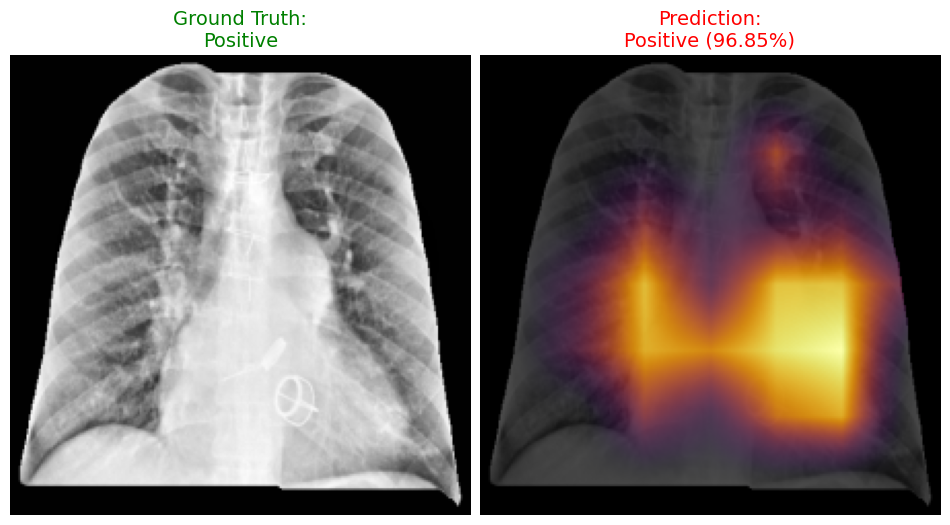

In [12]:
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

def reshape_transform(tensor):
    # Standard Swin-B output: (B, H, W, C) -> Permute to (B, C, H, W)
    if tensor.ndim == 4:
        return tensor.permute(0, 3, 1, 2)
    return tensor

# --- CONFIGURATION ---
INDEX = indices_dict['TP'][4] 
DATASET = d_nih_test
TARGET_CLASS = "Cardiomegaly"
FLIP_MODE = None

sample = DATASET[INDEX]
img_xrv = sample['img']

gt_text = "Unknown"
is_positive = False

if hasattr(DATASET, 'csv'):
    if 'Cardiomegaly' in DATASET.csv.columns:
        val = DATASET.csv.iloc[INDEX]['Cardiomegaly']
        if not np.isnan(val):
            is_positive = (int(val) == 1)
            gt_text = "Positive" if is_positive else "Negative"
            
    elif 'Finding Labels' in DATASET.csv.columns:
        label_text = DATASET.csv.iloc[INDEX]['Finding Labels']
        is_positive = TARGET_CLASS in label_text
        gt_text = "Positive" if is_positive else "Negative"

img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)

rgb_img = np.repeat(img_norm.transpose(1, 2, 0), 3, axis=2)

input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

with torch.no_grad():
    output = model(input_tensor)
    prob = torch.sigmoid(output).item()

if prob < 0.5:
    pred_text = f"Negative ({prob:.2%})"
    color_pred = 'blue'
else:
    pred_text = f"Positive ({prob:.2%})"
    color_pred = 'red'

target_layers = [model.norm]
cam = EigenCAM(
    model=model, 
    target_layers=target_layers, 
    reshape_transform=reshape_transform
)
grayscale_cam = cam(input_tensor=input_tensor, targets=[BinaryClassifierOutputTarget(0)])[0, :]

if FLIP_MODE == 'transpose':
    grayscale_cam = grayscale_cam.T
elif FLIP_MODE == 'left-right':
    grayscale_cam = np.fliplr(grayscale_cam)
elif FLIP_MODE == 'up-down':
    grayscale_cam = np.flipud(grayscale_cam)
elif FLIP_MODE == 'rotate-180':
    grayscale_cam = np.rot90(grayscale_cam, 2)

norm_image_uint8 = (img_norm[0] * 255).astype(np.uint8)
_, binary_mask = cv2.threshold(norm_image_uint8, 15, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    mask = filled_mask.astype(np.float32) / 255.0
else:
    mask = np.ones_like(img_norm[0])

masked_cam = grayscale_cam * mask
masked_cam = masked_cam - masked_cam.min()
if masked_cam.max() > 0:
    masked_cam = masked_cam / masked_cam.max()

background_weight = 0.3
cmap = plt.get_cmap('inferno')
cam_heatmap = cmap(masked_cam)[:, :, :3]

viz_masked = (background_weight * rgb_img * (1 - masked_cam[:, :, np.newaxis])) + \
        (cam_heatmap * masked_cam[:, :, np.newaxis])
viz_masked = np.clip(viz_masked, 0, 1)

fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace': 0.02})

axes[0].imshow(rgb_img)
axes[0].set_title(f"Ground Truth:\n{gt_text}", fontsize=14, 
                  color='green' if gt_text == "Positive" else 'black')
axes[0].axis('off')

axes[1].imshow(viz_masked)
axes[1].set_title(f"Prediction:\n{pred_text}", fontsize=14, 
                  color=color_pred)
axes[1].axis('off')

plt.subplots_adjust(wspace=0.02)
plt.savefig(f'viz_{gt_text}_cardiomegaly.png', dpi=300, bbox_inches='tight')
print(f"Saved viz_{gt_text}_cardiomegaly.png")
plt.show()

### Swin-B - SHAP

Background batch shape: torch.Size([50, 3, 224, 224])
Calculating SHAP for Index 248...
Saving to cardiomegaly_TP_SHAP.png...


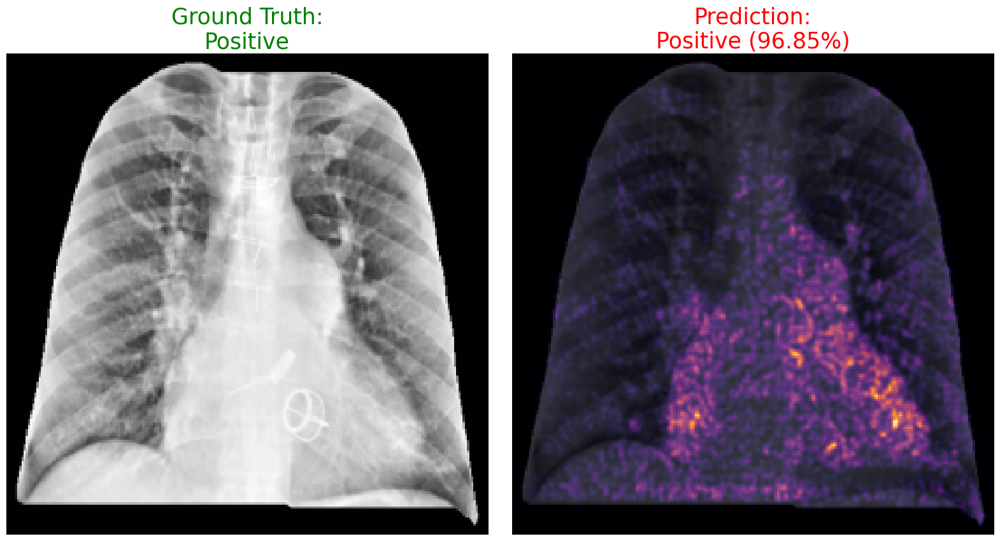

In [16]:
from torch.utils.data import DataLoader
loader = DataLoader(d_nih_test, batch_size=50, shuffle=True)

batch = next(iter(loader))
images = batch['img']
background_batch = images.repeat(1, 3, 1, 1).float().to(device)

print(f"Background batch shape: {background_batch.shape}")

explainer = shap.GradientExplainer(model, background_batch)
save_shap_positive_only(indices_dict['TP'][4], d_nih_test, model, explainer, sigma = 1, save_path="cardiomegaly_TP_SHAP.png", target_class="Cardiomegaly")

### Swin-B - Population

In [17]:
pc_png_test = PNGFolderDataset(img_dir="/home/varrel/imaging/all_images/PC_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/pc_test_split_filtered.csv",
    id_col="ImageID"
)

vindr_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/test_dataset/VinDr_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/vin_test_split.csv", id_col="image_id")

openi_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/Openi_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/openi_test_split_filtered.csv", id_col="filename")

d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_raw = xrv.datasets.NIH_Dataset(
    imgpath="/home/varrel/imaging/all_images/NIH_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/nih_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_mimic_raw = xrv.datasets.MIMIC_Dataset(
    imgpath="/home/varrel/imaging/all_images/MIMIC_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/mimic_test_split_xrv.csv",
    metacsvpath="/home/varrel/imaging/all_images/MIMIC_dataset/mimic-cxr-2.0.0-metadata.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_test = XRVCorrectionDataset(d_nih_raw)
d_chex_test = XRVCorrectionDataset(d_chex_raw)
d_mimic_test = XRVCorrectionDataset(d_mimic_raw)

classes = ['Cardiomegaly']
xrv.datasets.relabel_dataset(classes, d_chex_test)
xrv.datasets.relabel_dataset(classes, d_nih_test)
xrv.datasets.relabel_dataset(classes, d_mimic_test)
xrv.datasets.relabel_dataset(classes, pc_png_test)
xrv.datasets.relabel_dataset(classes, vindr_png_test)
xrv.datasets.relabel_dataset(classes, openi_png_test)

dmerge_test = xrv.datasets.MergeDataset([
   d_chex_test, d_nih_test, d_mimic_test, 
    pc_png_test, openi_png_test, vindr_png_test
])

{np.str_('Lung Opacity'), np.str_('Lung Lesion'), np.str_('Enlarged Cardiomediastinum'), np.str_('Pneumothorax'), np.str_('Consolidation'), np.str_('Fracture'), np.str_('Support Devices'), np.str_('Pleural Other'), np.str_('Pneumonia'), np.str_('Atelectasis'), np.str_('Edema'), np.str_('Effusion')} will be dropped
{'Mass', 'Pneumothorax', 'Consolidation', 'Fibrosis', 'Hernia', 'Infiltration', 'Emphysema', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Atelectasis', 'Edema', 'Effusion'} will be dropped
{np.str_('Lung Opacity'), np.str_('Lung Lesion'), np.str_('Enlarged Cardiomediastinum'), np.str_('Pneumothorax'), np.str_('Consolidation'), np.str_('Fracture'), np.str_('Support Devices'), np.str_('Pleural Other'), np.str_('Pneumonia'), np.str_('Atelectasis'), np.str_('Edema'), np.str_('Effusion')} will be dropped
{'Lung Opacity', 'Lung Lesion', 'Enlarged Cardio.', 'Pneumothorax', 'Consolidation', 'Fracture', 'Support Devices', 'Pleural Effusion', 'No Finding', 'Pneumonia', 'Atelectasis', 

In [18]:
indices_dict = find_tp_fp_indices(dmerge_test, model, threshold=0.587, target_class="Cardiomegaly", limit=250, max_scan=70000)

Selecting 70000 RANDOM indices from 74494 total images...
Scanning to find 250 examples for TP and FP...


  4%|▎         | 2597/70000 [01:11<30:55, 36.32it/s]

Found enough examples for both TP and FP!

--- Scanning Complete ---
TP (True Pos):  250 found
FP (False Pos): 250 found


Total Positive Predictions: 500
Generating Smoothed Global SHAP Map for 500 images...


100%|██████████| 500/500 [07:44<00:00,  1.08it/s]


Applying Gaussian Smoothing (sigma=1)...
Saving to cardiomegaly_population_shap_global.png...


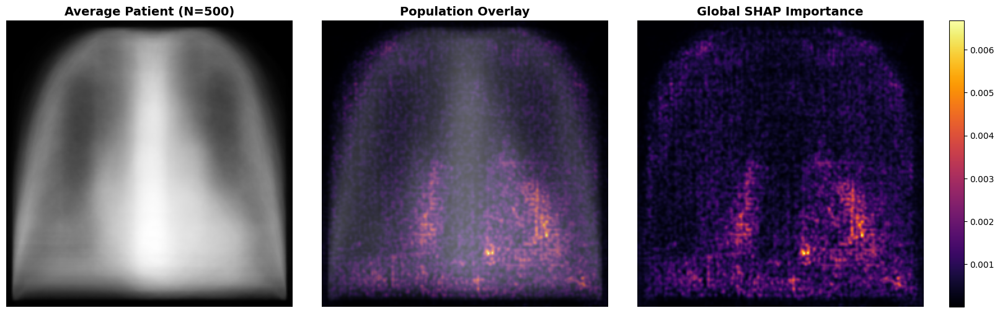

In [20]:
all_positive_preds = indices_dict['TP'] + indices_dict['FP']
print(f"Total Positive Predictions: {len(all_positive_preds)}")

generate_population_shap(all_positive_preds, dmerge_test, model, explainer, max_images=500, sigma=1, save_path="cardiomegaly_population_shap_global.png")

# Atelectasis

In [15]:
d_nih_raw = xrv.datasets.NIH_Dataset(
    imgpath="/home/varrel/imaging/all_images/NIH_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/nih_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_test = XRVCorrectionDataset(d_nih_raw)

### Swin-B - CAM

In [16]:
# Load the model
weights = models.Swin_B_Weights.IMAGENET1K_V1
model = models.swin_b(weights=weights)
model.head = nn.Linear(model.head.in_features, 1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = "/home/varrel/image_model_dict/final/fixed_swinb_atelectasis_model_epoch6.pth"
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

if 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
else:
    model.load_state_dict(checkpoint)

model = model.to(device)
model.eval()

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=512, out_features=128, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock

In [17]:
indices_dict = find_confusion_matrix_indices(d_nih_test, model, target_class="Atelectasis", threshold=0.587, limit=5)

Scanning up to 2000 images to find 5 examples per category for 'Atelectasis'...
Using column: 'Finding Labels' for Ground Truth.


  3%|▎         | 374/11061 [00:02<01:24, 126.83it/s]

Found enough examples for all categories!

--- Scanning Complete ---
TP (True Pos):  [147, 245, 275, 324, 325]
TN (True Neg):  [0, 1, 2, 3, 4]
FP (False Pos): [145, 322, 323, 369, 373]
FN (False Neg): [6, 12, 34, 35, 36]


Saved viz_Positive_atelectasis.png


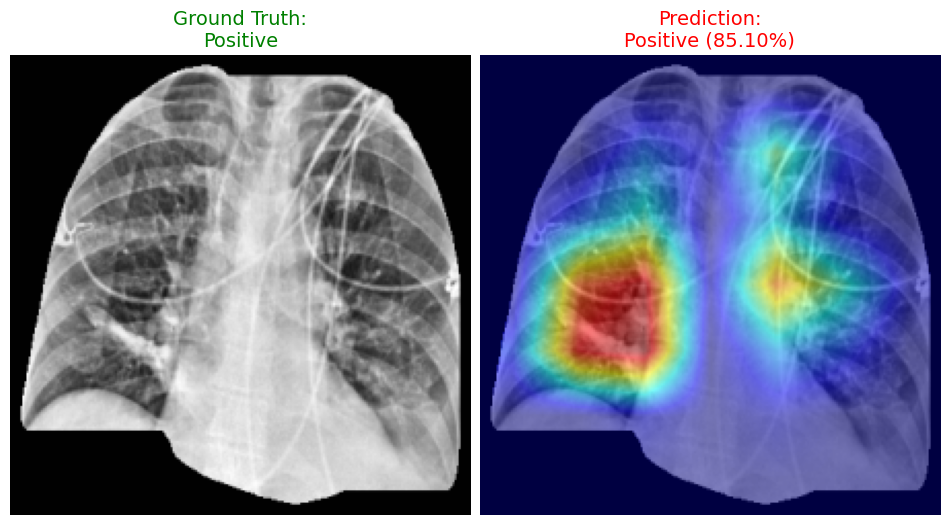

In [276]:
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

def reshape_transform(tensor):
    # Standard Swin-B output: (B, H, W, C) -> Permute to (B, C, H, W)
    if tensor.ndim == 4:
        return tensor.permute(0, 3, 1, 2)
    return tensor

# --- CONFIGURATION ---
INDEX = indices_dict['TP'][2]
DATASET = d_nih_test
TARGET_CLASS = "Atelectasis"
FLIP_MODE = None

sample = DATASET[INDEX]
img_xrv = sample['img']

gt_text = "Unknown"
is_positive = False

if hasattr(DATASET, 'csv'):
    if 'Cardiomegaly' in DATASET.csv.columns:
        val = DATASET.csv.iloc[INDEX]['Cardiomegaly']
        if not np.isnan(val):
            is_positive = (int(val) == 1)
            gt_text = "Positive" if is_positive else "Negative"
            
    elif 'Finding Labels' in DATASET.csv.columns:
        label_text = DATASET.csv.iloc[INDEX]['Finding Labels']
        is_positive = TARGET_CLASS in label_text
        gt_text = "Positive" if is_positive else "Negative"

img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)

rgb_img = np.repeat(img_norm.transpose(1, 2, 0), 3, axis=2)

input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

with torch.no_grad():
    output = model(input_tensor)
    prob = torch.sigmoid(output).item()

if prob < 0.5:
    pred_text = f"Negative ({prob:.2%})"
    color_pred = 'blue'
else:
    pred_text = f"Positive ({prob:.2%})"
    color_pred = 'red'

target_layers = [model.norm]
cam = EigenCAM(
    model=model, 
    target_layers=target_layers, 
    reshape_transform=reshape_transform
)
grayscale_cam = cam(input_tensor=input_tensor, targets=[BinaryClassifierOutputTarget(0)])[0, :]

if FLIP_MODE == 'transpose':
    grayscale_cam = grayscale_cam.T
elif FLIP_MODE == 'left-right':
    grayscale_cam = np.fliplr(grayscale_cam)
elif FLIP_MODE == 'up-down':
    grayscale_cam = np.flipud(grayscale_cam)
elif FLIP_MODE == 'rotate-180':
    grayscale_cam = np.rot90(grayscale_cam, 2)

norm_image_uint8 = (img_norm[0] * 255).astype(np.uint8)
_, binary_mask = cv2.threshold(norm_image_uint8, 15, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    mask = filled_mask.astype(np.float32) / 255.0
else:
    mask = np.ones_like(img_norm[0])

masked_cam = grayscale_cam * mask
masked_cam = masked_cam - masked_cam.min()
if masked_cam.max() > 0:
    masked_cam = masked_cam / masked_cam.max()

viz_masked = show_cam_on_image(rgb_img, masked_cam, use_rgb=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace': 0.02})

axes[0].imshow(rgb_img)
axes[0].set_title(f"Ground Truth:\n{gt_text}", fontsize=14, 
                  color='green' if gt_text == "Positive" else 'black')
axes[0].axis('off')

axes[1].imshow(viz_masked)
axes[1].set_title(f"Prediction:\n{pred_text}", fontsize=14, 
                  color=color_pred)
axes[1].axis('off')

plt.subplots_adjust(wspace=0.02)
plt.savefig(f'viz_{gt_text}_atelectasis.png', dpi=300, bbox_inches='tight')
print(f"Saved viz_{gt_text}_atelectasis.png")
plt.show()

### Swin-B - SHAP

Background batch shape: torch.Size([50, 3, 224, 224])
Calculating SHAP for Index 275...
Saving to atelectasis_TP_SHAP.png...


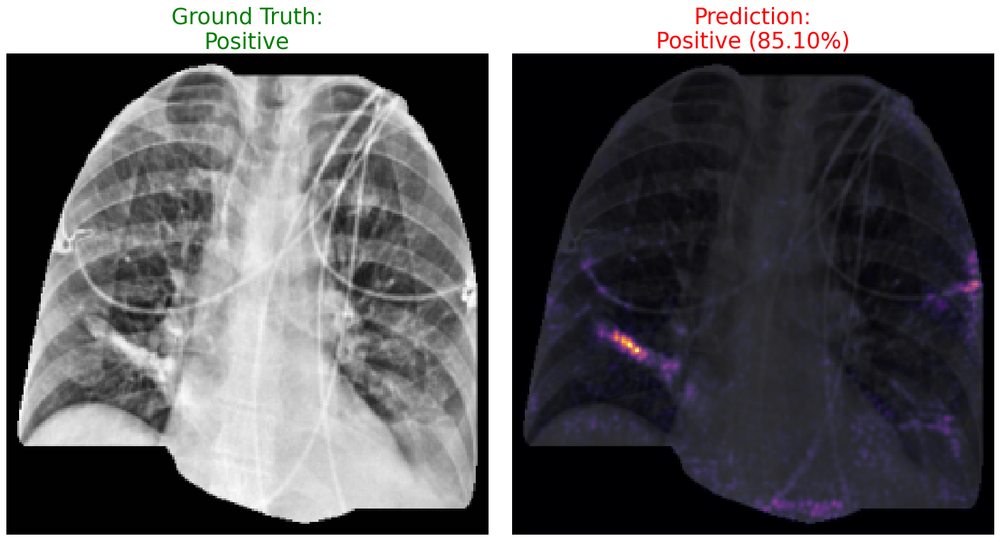

In [18]:
from torch.utils.data import DataLoader
loader = DataLoader(d_nih_test, batch_size=50, shuffle=True)

batch = next(iter(loader))
images = batch['img']
background_batch = images.repeat(1, 3, 1, 1).float().to(device)

print(f"Background batch shape: {background_batch.shape}")

explainer = shap.GradientExplainer(model, background_batch)
save_shap_positive_only(indices_dict['TP'][2], d_nih_test, model, explainer, sigma = 1, save_path="atelectasis_TP_SHAP.png", target_class="Atelectasis")

### Swin-B - Population

In [19]:
pc_png_test = PNGFolderDataset(img_dir="/home/varrel/imaging/all_images/PC_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/pc_test_split_filtered.csv",
    id_col="ImageID"
)

vindr_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/test_dataset/VinDr_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/vin_test_split.csv", id_col="image_id")

openi_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/Openi_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/openi_test_split_filtered.csv", id_col="filename")

d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_raw = xrv.datasets.NIH_Dataset(
    imgpath="/home/varrel/imaging/all_images/NIH_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/nih_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_mimic_raw = xrv.datasets.MIMIC_Dataset(
    imgpath="/home/varrel/imaging/all_images/MIMIC_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/mimic_test_split_xrv.csv",
    metacsvpath="/home/varrel/imaging/all_images/MIMIC_dataset/mimic-cxr-2.0.0-metadata.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_test = XRVCorrectionDataset(d_nih_raw)
d_chex_test = XRVCorrectionDataset(d_chex_raw)
d_mimic_test = XRVCorrectionDataset(d_mimic_raw)

classes = ['Atelectasis']
xrv.datasets.relabel_dataset(classes, d_chex_test)
xrv.datasets.relabel_dataset(classes, d_nih_test)
xrv.datasets.relabel_dataset(classes, d_mimic_test)
xrv.datasets.relabel_dataset(classes, pc_png_test)
xrv.datasets.relabel_dataset(classes, vindr_png_test)
xrv.datasets.relabel_dataset(classes, openi_png_test)

dmerge_test = xrv.datasets.MergeDataset([
   d_chex_test, d_nih_test, d_mimic_test, 
    pc_png_test, openi_png_test, vindr_png_test
])

{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'Pleural_Thickening', 'Effusion', 'Cardiomegaly', 'Emphysema', 'Hernia', 'Mass', 'Nodule', 'Pneumothorax', 'Fibrosis', 'Infiltration', 'Consolidation', 'Pneumonia', 'Edema'} will be dropped
{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'No Finding', 'Lung Opacity', 'Pneumonia', 'Pleural Effusion', 'Enlarged Cardio.', 'Cardiomegaly', 'Pneumothorax', 'Consolidation', 'Lung Lesion', 'Fracture', 'Edema', 'Suppo

In [20]:
indices_dict = find_tp_fp_indices(dmerge_test, model, threshold=0.568, target_class="Atelectasis", limit=250, max_scan=70000)

Selecting 70000 RANDOM indices from 74494 total images...
Scanning to find 250 examples for TP and FP...


  3%|▎         | 2399/70000 [00:17<07:59, 140.90it/s]

Found enough examples for both TP and FP!

--- Scanning Complete ---
TP (True Pos):  250 found
FP (False Pos): 250 found


Total Positive Predictions: 500
Generating Smoothed Global SHAP Map for 500 images...


100%|██████████| 500/500 [07:44<00:00,  1.08it/s]


Applying Gaussian Smoothing (sigma=1)...
Saving to atelectasis_population_shap_global.png...


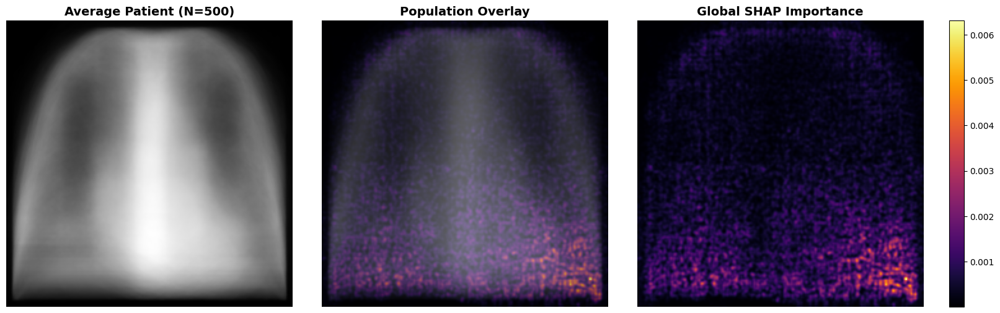

In [21]:
all_positive_preds = indices_dict['TP'] + indices_dict['FP']
print(f"Total Positive Predictions: {len(all_positive_preds)}")

generate_population_shap(all_positive_preds, dmerge_test, model, explainer, max_images=500, sigma=1, save_path="atelectasis_population_shap_global.png")

# Pleural Effusion

In [129]:
d_nih_raw = xrv.datasets.NIH_Dataset(
    imgpath="/home/varrel/imaging/all_images/NIH_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/nih_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_test = XRVCorrectionDataset(d_nih_raw)

### Swin-B - CAM

In [130]:
# Load the model
weights = models.Swin_B_Weights.IMAGENET1K_V1
model = models.swin_b(weights=weights)
model.head = nn.Linear(model.head.in_features, 1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = "/home/varrel/image_model_dict/final/fixed_swinb_effusion_model_epoch5.pth"
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

if 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
else:
    model.load_state_dict(checkpoint)

model = model.to(device)
model.eval()

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=512, out_features=128, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock

In [137]:
indices_dict = find_confusion_matrix_indices(d_nih_test, model, target_class="Effusion", threshold=0.590, limit=25)

Scanning up to 2000 images to find 25 examples per category for 'Effusion'...
Using column: 'Finding Labels' for Ground Truth.


  7%|▋         | 778/11061 [00:06<01:25, 120.32it/s]

Found enough examples for all categories!

--- Scanning Complete ---
TP (True Pos):  [1, 4, 6, 32, 34, 35, 36, 45, 57, 58, 79, 87, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 117, 118]
TN (True Neg):  [13, 19, 24, 27, 38, 42, 43, 44, 53, 54, 55, 56, 59, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72]
FP (False Pos): [0, 2, 3, 5, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 20, 21, 22, 23, 25, 26, 28, 29, 30, 31, 33]
FN (False Neg): [7, 41, 75, 78, 80, 195, 266, 277, 327, 376, 383, 435, 559, 671, 689, 694, 699, 700, 701, 702, 711, 713, 717, 727, 777]


Saved viz_Positive_effusion.png


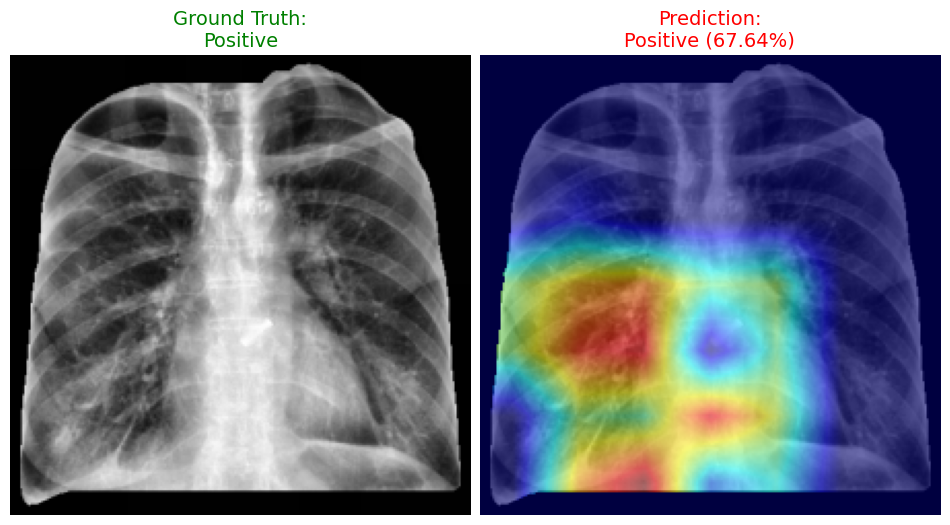

In [294]:
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

def reshape_transform(tensor):
    # Standard Swin-B output: (B, H, W, C) -> Permute to (B, C, H, W)
    if tensor.ndim == 4:
        return tensor.permute(0, 3, 1, 2)
    return tensor

# --- CONFIGURATION ---
INDEX = indices_dict['TP'][11]
DATASET = d_nih_test
TARGET_CLASS = "Effusion"
FLIP_MODE = None

sample = DATASET[INDEX]
img_xrv = sample['img']

gt_text = "Unknown"
is_positive = False

if hasattr(DATASET, 'csv'):
    if 'Cardiomegaly' in DATASET.csv.columns:
        val = DATASET.csv.iloc[INDEX]['Cardiomegaly']
        if not np.isnan(val):
            is_positive = (int(val) == 1)
            gt_text = "Positive" if is_positive else "Negative"
            
    elif 'Finding Labels' in DATASET.csv.columns:
        label_text = DATASET.csv.iloc[INDEX]['Finding Labels']
        is_positive = TARGET_CLASS in label_text
        gt_text = "Positive" if is_positive else "Negative"

img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)

rgb_img = np.repeat(img_norm.transpose(1, 2, 0), 3, axis=2)

input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

with torch.no_grad():
    output = model(input_tensor)
    prob = torch.sigmoid(output).item()

if prob < 0.5:
    pred_text = f"Negative ({prob:.2%})"
    color_pred = 'blue'
else:
    pred_text = f"Positive ({prob:.2%})"
    color_pred = 'red'

target_layers = [model.norm]
cam = EigenCAM(
    model=model, 
    target_layers=target_layers, 
    reshape_transform=reshape_transform
)
grayscale_cam = cam(input_tensor=input_tensor, targets=[BinaryClassifierOutputTarget(0)])[0, :]

if FLIP_MODE == 'transpose':
    grayscale_cam = grayscale_cam.T
elif FLIP_MODE == 'left-right':
    grayscale_cam = np.fliplr(grayscale_cam)
elif FLIP_MODE == 'up-down':
    grayscale_cam = np.flipud(grayscale_cam)
elif FLIP_MODE == 'rotate-180':
    grayscale_cam = np.rot90(grayscale_cam, 2)

norm_image_uint8 = (img_norm[0] * 255).astype(np.uint8)
_, binary_mask = cv2.threshold(norm_image_uint8, 15, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    mask = filled_mask.astype(np.float32) / 255.0
else:
    mask = np.ones_like(img_norm[0])

masked_cam = grayscale_cam * mask
masked_cam = masked_cam - masked_cam.min()
if masked_cam.max() > 0:
    masked_cam = masked_cam / masked_cam.max()

viz_masked = show_cam_on_image(rgb_img, masked_cam, use_rgb=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace': 0.02})

axes[0].imshow(rgb_img)
axes[0].set_title(f"Ground Truth:\n{gt_text}", fontsize=14, 
                  color='green' if gt_text == "Positive" else 'black')
axes[0].axis('off')

axes[1].imshow(viz_masked)
axes[1].set_title(f"Prediction:\n{pred_text}", fontsize=14, 
                  color=color_pred)
axes[1].axis('off')

plt.subplots_adjust(wspace=0.02)
plt.savefig(f'viz_{gt_text}_effusion.png', dpi=300, bbox_inches='tight')
print(f"Saved viz_{gt_text}_effusion.png")
plt.show()

### Swin-B - SHAP

Background batch shape: torch.Size([50, 3, 224, 224])
Calculating SHAP for Index 87...
Saving to effusion_TP_SHAP.png...


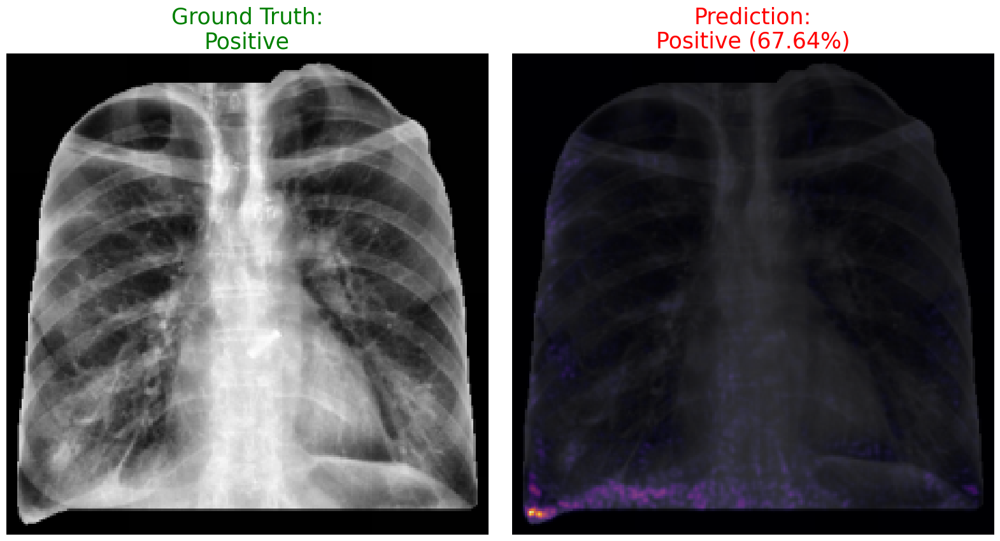

In [145]:
from torch.utils.data import DataLoader
loader = DataLoader(d_nih_test, batch_size=50, shuffle=True)

batch = next(iter(loader))
images = batch['img']
background_batch = images.repeat(1, 3, 1, 1).float().to(device)

print(f"Background batch shape: {background_batch.shape}")

explainer = shap.GradientExplainer(model, background_batch)
save_shap_positive_only(indices_dict['TP'][11], d_nih_test, model, explainer, sigma = 1, save_path="effusion_TP_SHAP.png", target_class="Effusion")

### Swin-B - Population

In [26]:
pc_png_test = PNGFolderDataset(img_dir="/home/varrel/imaging/all_images/PC_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/pc_test_split_filtered.csv",
    id_col="ImageID"
)

vindr_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/test_dataset/VinDr_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/vin_test_split.csv", id_col="image_id")

openi_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/Openi_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/openi_test_split_filtered.csv", id_col="filename")

d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_raw = xrv.datasets.NIH_Dataset(
    imgpath="/home/varrel/imaging/all_images/NIH_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/nih_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_mimic_raw = xrv.datasets.MIMIC_Dataset(
    imgpath="/home/varrel/imaging/all_images/MIMIC_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/mimic_test_split_xrv.csv",
    metacsvpath="/home/varrel/imaging/all_images/MIMIC_dataset/mimic-cxr-2.0.0-metadata.csv",
    views=["PA","AP"], unique_patients=False)

classes = ['Effusion']
xrv.datasets.relabel_dataset(classes, d_chex_raw)
xrv.datasets.relabel_dataset(classes, d_nih_raw)
xrv.datasets.relabel_dataset(classes, d_mimic_raw)

d_nih_test = XRVCorrectionDataset(d_nih_raw)
d_chex_test = XRVCorrectionDataset(d_chex_raw)
d_mimic_test = XRVCorrectionDataset(d_mimic_raw)

pc_png_test.pathologies = [
    "Effusion" if p == "Pleural Effusion" else p
    for p in pc_png_test.pathologies
]
vindr_png_test.pathologies = [
    "Effusion" if p == "Pleural Effusion" else p
    for p in vindr_png_test.pathologies
]
openi_png_test.pathologies = [
    "Effusion" if p == "Pleural Effusion" else p
    for p in openi_png_test.pathologies
]
xrv.datasets.relabel_dataset(classes, pc_png_test)
xrv.datasets.relabel_dataset(classes, vindr_png_test)
xrv.datasets.relabel_dataset(classes, openi_png_test)

dmerge_test = xrv.datasets.MergeDataset([
   d_chex_test, d_nih_test, d_mimic_test, 
    pc_png_test, openi_png_test, vindr_png_test
])

{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'Pleural_Thickening', 'Cardiomegaly', 'Emphysema', 'Hernia', 'Mass', 'Nodule', 'Pneumothorax', 'Fibrosis', 'Infiltration', 'Consolidation', 'Pneumonia', 'Atelectasis', 'Edema'} will be dropped
{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'No Finding', 'Lung Opacity', 'Pneumonia', 'Enlarged Cardio.', 'Cardiomegaly', 'Pneumothorax', 'Consolidation', 'Lung Lesion', 'Atelectasis', 'Fracture', 'Edema', 'S

In [27]:
indices_dict = find_tp_fp_indices(dmerge_test, model, threshold=0.590, target_class="Effusion", limit=250, max_scan=70000)

Selecting 70000 RANDOM indices from 74494 total images...
Scanning to find 250 examples for TP and FP...


 37%|███▋      | 25901/70000 [01:12<02:04, 354.89it/s] 

Found enough examples for both TP and FP!

--- Scanning Complete ---
TP (True Pos):  250 found
FP (False Pos): 250 found


Total Positive Predictions: 500
Generating Smoothed Global SHAP Map for 500 images...


100%|██████████| 500/500 [07:47<00:00,  1.07it/s]


Applying Gaussian Smoothing (sigma=1)...
Saving to effusion_population_shap_global.png...


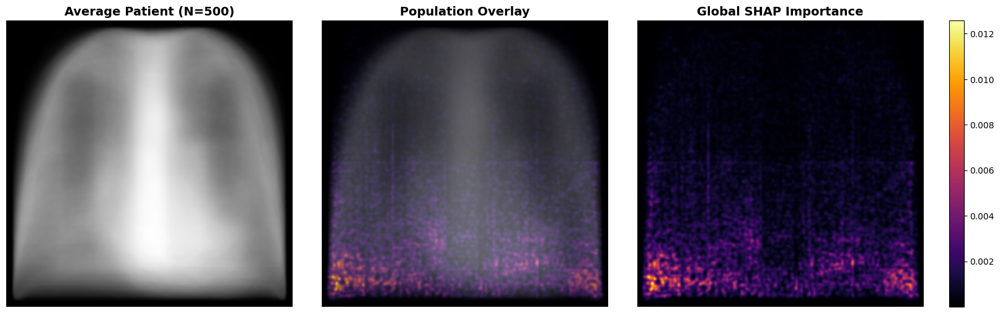

In [28]:
all_positive_preds = indices_dict['TP'] + indices_dict['FP']
print(f"Total Positive Predictions: {len(all_positive_preds)}")

generate_population_shap(all_positive_preds, dmerge_test, model, explainer, max_images=500, sigma=1, save_path="effusion_population_shap_global.png")

# Support Devices

In [29]:
d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_chex_test = XRVCorrectionDataset(d_chex_raw)

### Swin-B - CAM

In [30]:
# Load the model
weights = models.Swin_B_Weights.IMAGENET1K_V1
model = models.swin_b(weights=weights)
model.head = nn.Linear(model.head.in_features, 1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = "/home/varrel/image_model_dict/final/fixed_swinb_supportdevice_model_epoch6.pth"
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

if 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
else:
    model.load_state_dict(checkpoint)

model = model.to(device)
model.eval()

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=512, out_features=128, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock

In [31]:
indices_dict = find_confusion_matrix_indices(d_chex_test, model, target_class="Support Devices", threshold=0.495, limit=5)

Scanning up to 2000 images to find 5 examples per category for 'Support Devices'...
Using column: 'Support Devices' for Ground Truth.


  1%|          | 122/19295 [00:01<04:55, 64.83it/s]

Found enough examples for all categories!

--- Scanning Complete ---
TP (True Pos):  [3, 4, 5, 8, 9]
TN (True Neg):  [0, 1, 2, 7, 16]
FP (False Pos): [78, 109, 110, 117, 121]
FN (False Neg): [6, 13, 18, 22, 36]


Saved viz_Positive_sd.png


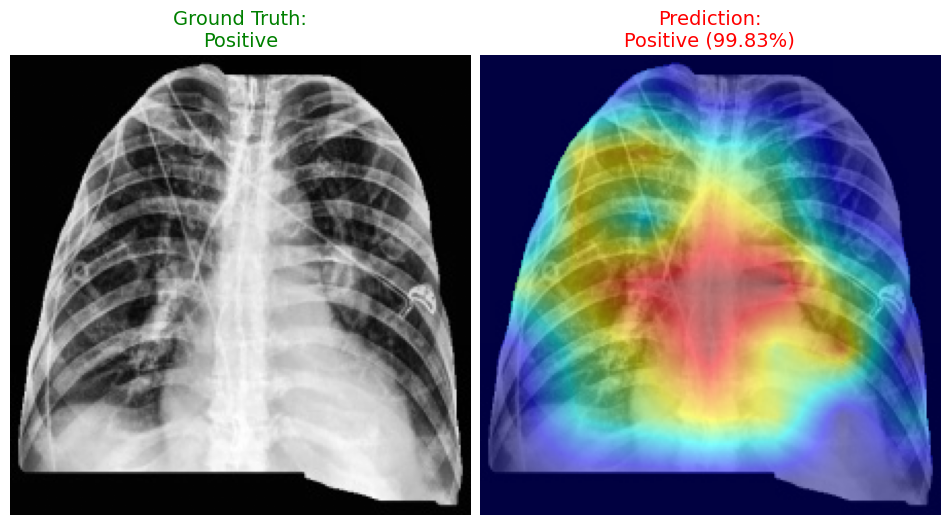

In [302]:
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

def reshape_transform(tensor):
    # Standard Swin-B output: (B, H, W, C) -> Permute to (B, C, H, W)
    if tensor.ndim == 4:
        return tensor.permute(0, 3, 1, 2)
    return tensor

# --- CONFIGURATION ---
INDEX = indices_dict['TP'][1]
DATASET = d_chex_test
TARGET_CLASS = "Support Devices"
FLIP_MODE = None

sample = DATASET[INDEX]
img_xrv = sample['img']

gt_text = "Unknown"
is_positive = False

if hasattr(DATASET, 'csv'):
    if 'Support Devices' in DATASET.csv.columns:
        val = DATASET.csv.iloc[INDEX]['Support Devices']
        if not np.isnan(val):
            is_positive = (int(val) == 1)
            gt_text = "Positive" if is_positive else "Negative"
            
    elif 'Finding Labels' in DATASET.csv.columns:
        label_text = DATASET.csv.iloc[INDEX]['Finding Labels']
        is_positive = TARGET_CLASS in label_text
        gt_text = "Positive" if is_positive else "Negative"

img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)

rgb_img = np.repeat(img_norm.transpose(1, 2, 0), 3, axis=2)

input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

with torch.no_grad():
    output = model(input_tensor)
    prob = torch.sigmoid(output).item()

if prob < 0.5:
    pred_text = f"Negative ({prob:.2%})"
    color_pred = 'blue'
else:
    pred_text = f"Positive ({prob:.2%})"
    color_pred = 'red'

target_layers = [model.norm]
cam = EigenCAM(
    model=model, 
    target_layers=target_layers, 
    reshape_transform=reshape_transform
)
grayscale_cam = cam(input_tensor=input_tensor, targets=[BinaryClassifierOutputTarget(0)])[0, :]

if FLIP_MODE == 'transpose':
    grayscale_cam = grayscale_cam.T
elif FLIP_MODE == 'left-right':
    grayscale_cam = np.fliplr(grayscale_cam)
elif FLIP_MODE == 'up-down':
    grayscale_cam = np.flipud(grayscale_cam)
elif FLIP_MODE == 'rotate-180':
    grayscale_cam = np.rot90(grayscale_cam, 2)

norm_image_uint8 = (img_norm[0] * 255).astype(np.uint8)
_, binary_mask = cv2.threshold(norm_image_uint8, 15, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    mask = filled_mask.astype(np.float32) / 255.0
else:
    mask = np.ones_like(img_norm[0])

masked_cam = grayscale_cam * mask
masked_cam = masked_cam - masked_cam.min()
if masked_cam.max() > 0:
    masked_cam = masked_cam / masked_cam.max()

viz_masked = show_cam_on_image(rgb_img, masked_cam, use_rgb=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace': 0.02})

axes[0].imshow(rgb_img)
axes[0].set_title(f"Ground Truth:\n{gt_text}", fontsize=14, 
                  color='green' if gt_text == "Positive" else 'black')
axes[0].axis('off')

axes[1].imshow(viz_masked)
axes[1].set_title(f"Prediction:\n{pred_text}", fontsize=14, 
                  color=color_pred)
axes[1].axis('off')

plt.subplots_adjust(wspace=0.02)
plt.savefig(f'viz_{gt_text}_sd.png', dpi=300, bbox_inches='tight')
print(f"Saved viz_{gt_text}_sd.png")
plt.show()

### Swin-B - SHAP

Background batch shape: torch.Size([50, 3, 224, 224])
Calculating SHAP for Index 4...
Saving to sd_TP_SHAP.png...


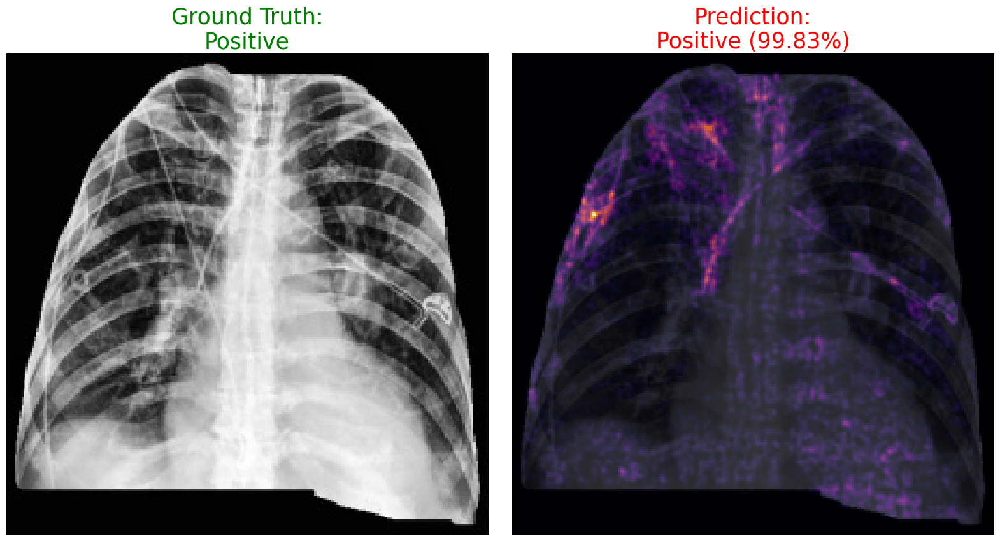

In [32]:
from torch.utils.data import DataLoader
loader = DataLoader(d_nih_test, batch_size=50, shuffle=True)

batch = next(iter(loader))
images = batch['img']
background_batch = images.repeat(1, 3, 1, 1).float().to(device)

print(f"Background batch shape: {background_batch.shape}")

explainer = shap.GradientExplainer(model, background_batch)
save_shap_positive_only(indices_dict['TP'][1], d_chex_test, model, explainer, sigma = 1, save_path="sd_TP_SHAP.png", target_class="Support Devices")

### Swin-B - Population

In [33]:
pc_png_test = PNGFolderDataset(img_dir="/home/varrel/imaging/all_images/PC_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/pc_test_split_filtered.csv",
    id_col="ImageID"
)

openi_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/Openi_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/openi_test_split_filtered.csv", id_col="filename")

d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_mimic_raw = xrv.datasets.MIMIC_Dataset(
    imgpath="/home/varrel/imaging/all_images/MIMIC_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/mimic_test_split_xrv.csv",
    metacsvpath="/home/varrel/imaging/all_images/MIMIC_dataset/mimic-cxr-2.0.0-metadata.csv",
    views=["PA","AP"], unique_patients=False)

ox_png_test = PNGFolderDataset(img_dir="/home/varrel/test_images/OX_dataset/images_all/dev/train/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/ox_test_split.csv",
    id_col="image_name"
)

classes = ['Support Devices']
xrv.datasets.relabel_dataset(classes, d_chex_raw)
xrv.datasets.relabel_dataset(classes, d_mimic_raw)
d_chex_test = XRVCorrectionDataset(d_chex_raw)
d_mimic_test = XRVCorrectionDataset(d_mimic_raw)

ox_png_test.pathologies = [
    "Support Devices" if p == "Support Device" else p
    for p in ox_png_test.pathologies
]
xrv.datasets.relabel_dataset(classes, pc_png_test)
xrv.datasets.relabel_dataset(classes, ox_png_test)
xrv.datasets.relabel_dataset(classes, openi_png_test)

dmerge_test = xrv.datasets.MergeDataset([
    d_chex_test, d_mimic_test, 
    pc_png_test, openi_png_test, ox_png_test
])

{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other')} will be dropped
{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other')} will be dropped
{'No Finding', 'Lung Opacity', 'Pneumonia', 'Pleural Effusion', 'Enlarged Cardio.', 'Cardiomegaly', 'Pneumothorax', 'Consolidation', 'Lung Lesion', 'Atelectasis', 'Fracture', 'Edema'} will be dropped
{'No Finding', 'Lung Opacity', 'Pneumonia', 'Pleural Effusion', 'Enlarged Cardio.', 'Cardiomegaly', 'Pneumothorax', 'Consolidation', 'Lung Lesion', 'Atelectasis', 'Fracture',

In [34]:
indices_dict = find_tp_fp_indices(dmerge_test, model, threshold=0.55, target_class="Support Devices", limit=250, max_scan=70000)

Selecting 61433 RANDOM indices from 61433 total images...
Scanning to find 250 examples for TP and FP...


  5%|▍         | 3069/61433 [01:04<20:19, 47.88it/s]

Found enough examples for both TP and FP!

--- Scanning Complete ---
TP (True Pos):  250 found
FP (False Pos): 250 found


Total Positive Predictions: 500
Generating Smoothed Global SHAP Map for 500 images...


100%|██████████| 500/500 [07:48<00:00,  1.07it/s]


Applying Gaussian Smoothing (sigma=1)...
Saving to sd_population_shap_global.png...


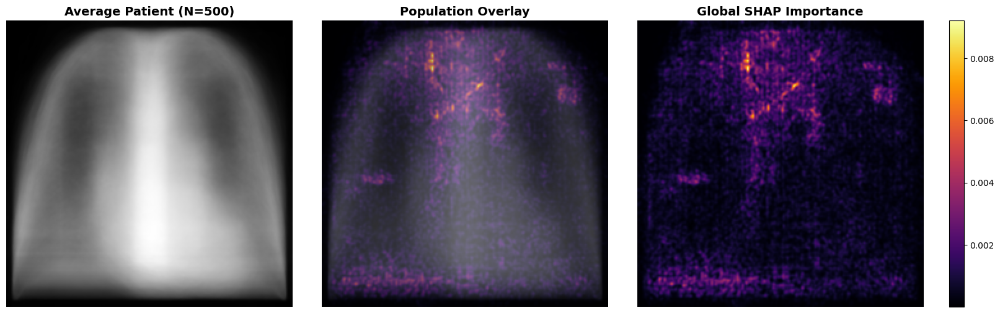

In [35]:
all_positive_preds = indices_dict['TP'] + indices_dict['FP']
print(f"Total Positive Predictions: {len(all_positive_preds)}")

generate_population_shap(all_positive_preds, dmerge_test, model, explainer, max_images=500, sigma=1, save_path="sd_population_shap_global.png")

# Consolidation

In [36]:
d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_chex_test = XRVCorrectionDataset(d_chex_raw)

### Swin-B - CAM

In [37]:
# Load the model
weights = models.Swin_B_Weights.IMAGENET1K_V1
model = models.swin_b(weights=weights)
model.head = nn.Linear(model.head.in_features, 1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = "/home/varrel/image_model_dict/final/fixed_swinb_consolidation_model_epoch4.pth"
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

if 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
else:
    model.load_state_dict(checkpoint)

model = model.to(device)
model.eval()

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=512, out_features=128, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock

In [38]:
indices_dict = find_confusion_matrix_indices(d_chex_test, model, target_class="Consolidation", threshold=0.660, limit=10)

Scanning up to 2000 images to find 10 examples per category for 'Consolidation'...
Using column: 'Consolidation' for Ground Truth.


  1%|          | 166/19295 [00:01<03:18, 96.46it/s] 

Found enough examples for all categories!

--- Scanning Complete ---
TP (True Pos):  [4, 5, 6, 7, 9, 11, 12, 20, 21, 22]
TN (True Neg):  [0, 1, 2, 16, 17, 32, 33, 34, 36, 37]
FP (False Pos): [3, 8, 10, 13, 15, 19, 35, 39, 63, 70]
FN (False Neg): [14, 18, 73, 102, 109, 122, 128, 135, 152, 165]


Saved viz_Positive_consolidation.png


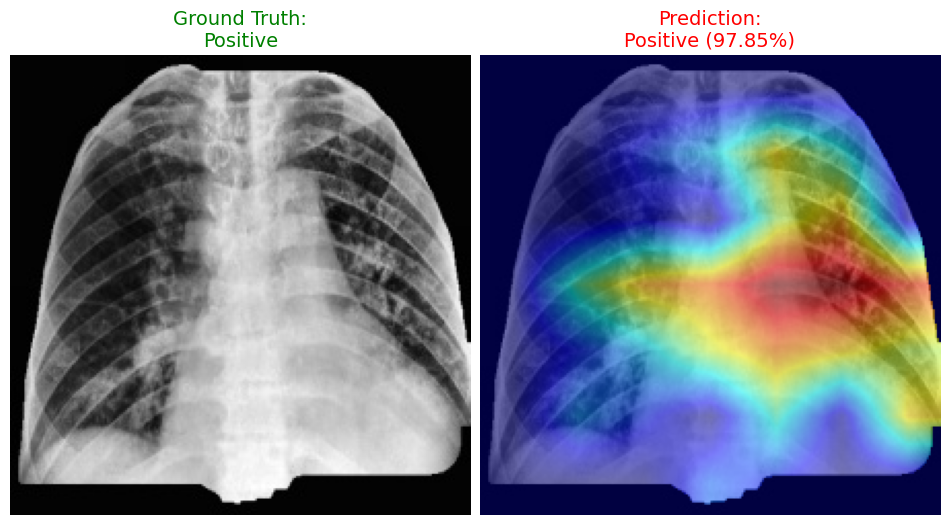

In [35]:
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

def reshape_transform(tensor):
    # Standard Swin-B output: (B, H, W, C) -> Permute to (B, C, H, W)
    if tensor.ndim == 4:
        return tensor.permute(0, 3, 1, 2)
    return tensor

INDEX = indices_dict['TP'][9]
DATASET = d_chex_test
TARGET_CLASS = "Consolidation"
FLIP_MODE = None

sample = DATASET[INDEX]
img_xrv = sample['img']

gt_text = "Unknown"
is_positive = False

if hasattr(DATASET, 'csv'):
    
    if 'Consolidation' in DATASET.csv.columns:
        val = DATASET.csv.iloc[INDEX]['Consolidation']
        if not np.isnan(val):
            is_positive = (int(val) == 1)
            gt_text = "Positive" if is_positive else "Negative"
            
    elif 'Finding Labels' in DATASET.csv.columns:
        label_text = DATASET.csv.iloc[INDEX]['Finding Labels']
        is_positive = TARGET_CLASS in label_text
        gt_text = "Positive" if is_positive else "Negative"

img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)

rgb_img = np.repeat(img_norm.transpose(1, 2, 0), 3, axis=2)

input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

with torch.no_grad():
    output = model(input_tensor)
    prob = torch.sigmoid(output).item()

if prob < 0.5:
    pred_text = f"Negative ({prob:.2%})"
    color_pred = 'blue'
else:
    pred_text = f"Positive ({prob:.2%})"
    color_pred = 'red'

target_layers = [model.norm]
cam = EigenCAM(
    model=model, 
    target_layers=target_layers, 
    reshape_transform=reshape_transform
)
grayscale_cam = cam(input_tensor=input_tensor, targets=[BinaryClassifierOutputTarget(0)])[0, :]

if FLIP_MODE == 'transpose':
    grayscale_cam = grayscale_cam.T
elif FLIP_MODE == 'left-right':
    grayscale_cam = np.fliplr(grayscale_cam)
elif FLIP_MODE == 'up-down':
    grayscale_cam = np.flipud(grayscale_cam)
elif FLIP_MODE == 'rotate-180':
    grayscale_cam = np.rot90(grayscale_cam, 2)

norm_image_uint8 = (img_norm[0] * 255).astype(np.uint8)
_, binary_mask = cv2.threshold(norm_image_uint8, 15, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    mask = filled_mask.astype(np.float32) / 255.0
else:
    mask = np.ones_like(img_norm[0])

masked_cam = grayscale_cam * mask
masked_cam = masked_cam - masked_cam.min()
if masked_cam.max() > 0:
    masked_cam = masked_cam / masked_cam.max()

viz_masked = show_cam_on_image(rgb_img, masked_cam, use_rgb=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace': 0.02})

axes[0].imshow(rgb_img)
axes[0].set_title(f"Ground Truth:\n{gt_text}", fontsize=14, 
                  color='green' if gt_text == "Positive" else 'black')
axes[0].axis('off')

axes[1].imshow(viz_masked)
axes[1].set_title(f"Prediction:\n{pred_text}", fontsize=14, 
                  color=color_pred)
axes[1].axis('off')

plt.subplots_adjust(wspace=0.02)
plt.savefig(f'viz_{gt_text}_consolidation.png', dpi=300, bbox_inches='tight')
print(f"Saved viz_{gt_text}_consolidation.png")
plt.show()

### Swin-B - SHAP

Background batch shape: torch.Size([50, 3, 224, 224])
Calculating SHAP for Index 22...
Saving to consolidation_TP_SHAP.png...


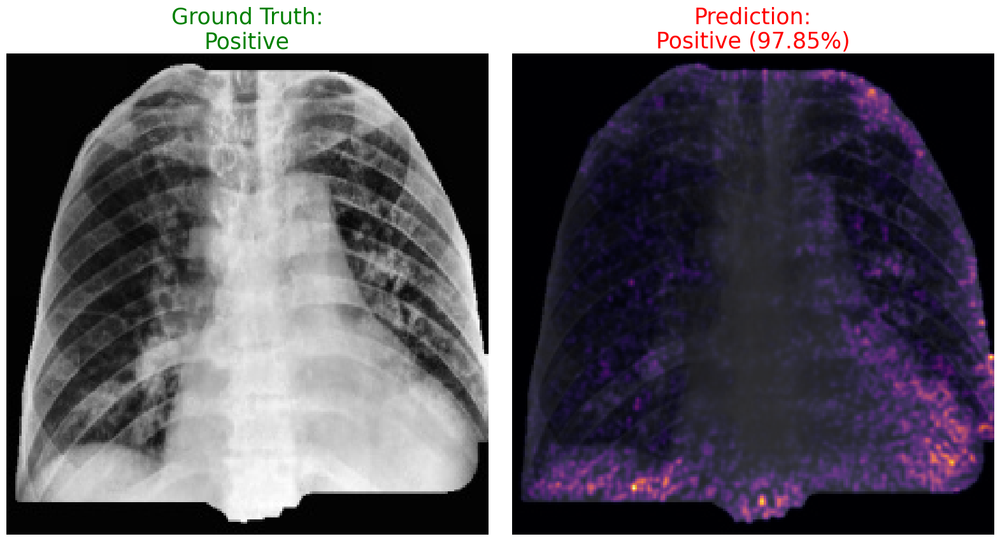

In [39]:
from torch.utils.data import DataLoader
loader = DataLoader(d_chex_test, batch_size=50, shuffle=True)

batch = next(iter(loader))
images = batch['img']
background_batch = images.repeat(1, 3, 1, 1).float().to(device)

print(f"Background batch shape: {background_batch.shape}")

explainer = shap.GradientExplainer(model, background_batch)
save_shap_positive_only(indices_dict['TP'][9], d_chex_test, model, explainer, sigma = 1, save_path="consolidation_TP_SHAP.png", target_class="Consolidation")

### Swin-B - Population

In [40]:
pc_png_test = PNGFolderDataset(img_dir="/home/varrel/imaging/all_images/PC_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/pc_test_split_filtered.csv",
    id_col="ImageID"
)

vindr_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/test_dataset/VinDr_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/vin_test_split.csv", id_col="image_id")

openi_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/Openi_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/openi_test_split_filtered.csv", id_col="filename")

d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_raw = xrv.datasets.NIH_Dataset(
    imgpath="/home/varrel/imaging/all_images/NIH_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/nih_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_mimic_raw = xrv.datasets.MIMIC_Dataset(
    imgpath="/home/varrel/imaging/all_images/MIMIC_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/mimic_test_split_xrv.csv",
    metacsvpath="/home/varrel/imaging/all_images/MIMIC_dataset/mimic-cxr-2.0.0-metadata.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_test = XRVCorrectionDataset(d_nih_raw)
d_chex_test = XRVCorrectionDataset(d_chex_raw)
d_mimic_test = XRVCorrectionDataset(d_mimic_raw)

classes = ['Consolidation']
xrv.datasets.relabel_dataset(classes, d_chex_test)
xrv.datasets.relabel_dataset(classes, d_nih_test)
xrv.datasets.relabel_dataset(classes, d_mimic_test)
xrv.datasets.relabel_dataset(classes, pc_png_test)
xrv.datasets.relabel_dataset(classes, vindr_png_test)
xrv.datasets.relabel_dataset(classes, openi_png_test)

dmerge_test = xrv.datasets.MergeDataset([
   d_chex_test, d_nih_test, d_mimic_test, 
    pc_png_test, openi_png_test, vindr_png_test
])

{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'Pleural_Thickening', 'Effusion', 'Cardiomegaly', 'Emphysema', 'Hernia', 'Mass', 'Nodule', 'Pneumothorax', 'Fibrosis', 'Infiltration', 'Pneumonia', 'Atelectasis', 'Edema'} will be dropped
{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'No Finding', 'Lung Opacity', 'Pneumonia', 'Pleural Effusion', 'Enlarged Cardio.', 'Cardiomegaly', 'Pneumothorax', 'Lung Lesion', 'Atelectasis', 'Fracture', 'Edema', 'Support Devic

In [41]:
indices_dict = find_tp_fp_indices(dmerge_test, model, threshold=0.660, target_class="Consolidation", limit=250, max_scan=70000)

Selecting 70000 RANDOM indices from 74494 total images...
Scanning to find 250 examples for TP and FP...


  8%|▊         | 5608/70000 [01:21<15:35, 68.86it/s] 


Found enough examples for both TP and FP!

--- Scanning Complete ---
TP (True Pos):  250 found
FP (False Pos): 250 found


Total Positive Predictions: 500
Generating Smoothed Global SHAP Map for 500 images...


100%|██████████| 500/500 [07:47<00:00,  1.07it/s]


Applying Gaussian Smoothing (sigma=1)...
Saving to consolidation_population_shap_global.png...


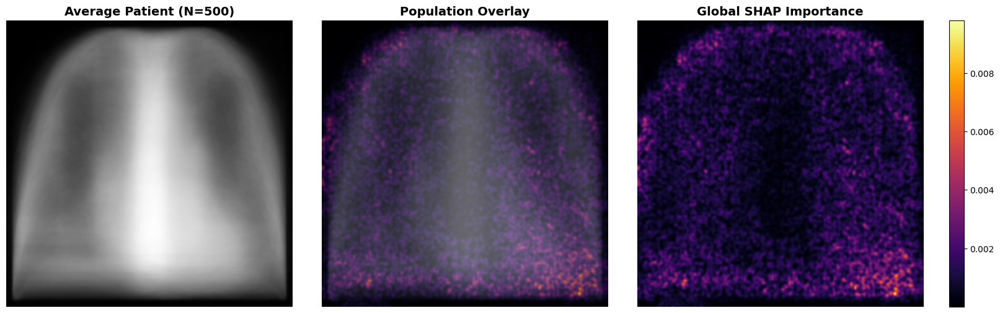

In [42]:
all_positive_preds = indices_dict['TP'] + indices_dict['FP']
print(f"Total Positive Predictions: {len(all_positive_preds)}")

generate_population_shap(all_positive_preds, dmerge_test, model, explainer, max_images=500, sigma=1, save_path="consolidation_population_shap_global.png")

# Edema

In [108]:
d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_chex_test = XRVCorrectionDataset(d_chex_raw)

### Swin-B - CAM

In [109]:
# Load the model
weights = models.Swin_B_Weights.IMAGENET1K_V1
model = models.swin_b(weights=weights)
model.head = nn.Linear(model.head.in_features, 1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = "/home/varrel/image_model_dict/final/fixed_swinb_edema_model_epoch4.pth"
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

if 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
else:
    model.load_state_dict(checkpoint)

model = model.to(device)
model.eval()

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=512, out_features=128, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock

In [110]:
indices_dict = find_confusion_matrix_indices(d_chex_test, model, target_class="Edema", threshold=0.659, limit=15)

Scanning up to 2000 images to find 15 examples per category for 'Edema'...
Using column: 'Edema' for Ground Truth.


  1%|          | 213/19295 [00:01<02:27, 129.14it/s]

Found enough examples for all categories!

--- Scanning Complete ---
TP (True Pos):  [5, 18, 19, 21, 22, 29, 30, 43, 45, 46, 47, 48, 49, 50, 51]
TN (True Neg):  [0, 1, 2, 6, 8, 9, 10, 11, 13, 14, 15, 16, 17, 24, 27]
FP (False Pos): [3, 4, 12, 20, 23, 25, 26, 28, 44, 55, 62, 67, 85, 88, 90]
FN (False Neg): [7, 31, 42, 52, 78, 102, 111, 120, 124, 125, 128, 151, 157, 163, 212]


Saved viz_Positive_edema.png


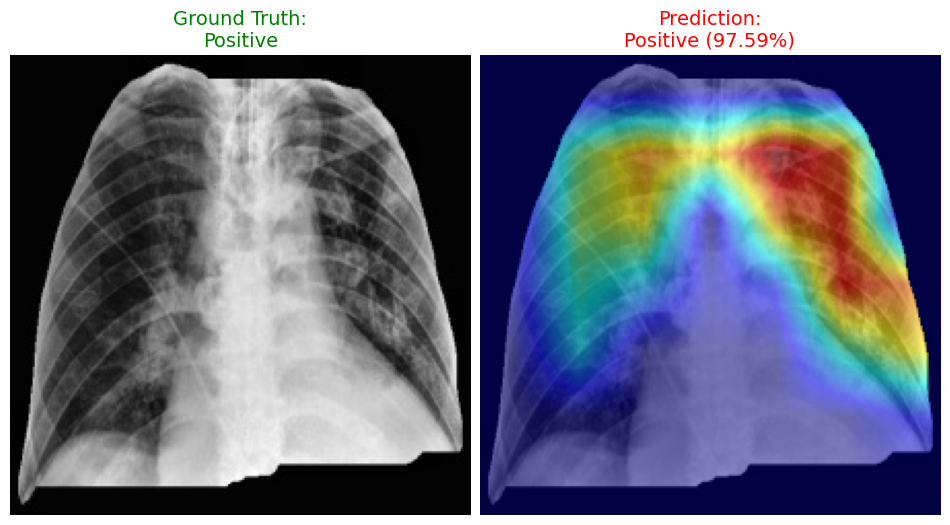

In [43]:
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

def reshape_transform(tensor):
    if tensor.ndim == 4:
        return tensor.permute(0, 3, 1, 2)
    return tensor

# --- CONFIGURATION ---
INDEX = indices_dict['TP'][3]
DATASET = d_chex_test
TARGET_CLASS = "Edema"
FLIP_MODE = None

sample = DATASET[INDEX]
img_xrv = sample['img']

gt_text = "Unknown"
is_positive = False

if hasattr(DATASET, 'csv'):
    if 'Edema' in DATASET.csv.columns:
        val = DATASET.csv.iloc[INDEX]['Edema']
        if not np.isnan(val):
            is_positive = (int(val) == 1)
            gt_text = "Positive" if is_positive else "Negative"
            
    elif 'Finding Labels' in DATASET.csv.columns:
        label_text = DATASET.csv.iloc[INDEX]['Finding Labels']
        is_positive = TARGET_CLASS in label_text
        gt_text = "Positive" if is_positive else "Negative"

img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)

rgb_img = np.repeat(img_norm.transpose(1, 2, 0), 3, axis=2)

input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

with torch.no_grad():
    output = model(input_tensor)
    prob = torch.sigmoid(output).item()

if prob < 0.5:
    pred_text = f"Negative ({prob:.2%})"
    color_pred = 'blue'
else:
    pred_text = f"Positive ({prob:.2%})"
    color_pred = 'red'

target_layers = [model.norm]
cam = EigenCAM(
    model=model, 
    target_layers=target_layers, 
    reshape_transform=reshape_transform
)
grayscale_cam = cam(input_tensor=input_tensor, targets=[BinaryClassifierOutputTarget(0)])[0, :]

if FLIP_MODE == 'transpose':
    grayscale_cam = grayscale_cam.T
elif FLIP_MODE == 'left-right':
    grayscale_cam = np.fliplr(grayscale_cam)
elif FLIP_MODE == 'up-down':
    grayscale_cam = np.flipud(grayscale_cam)
elif FLIP_MODE == 'rotate-180':
    grayscale_cam = np.rot90(grayscale_cam, 2)

norm_image_uint8 = (img_norm[0] * 255).astype(np.uint8)
_, binary_mask = cv2.threshold(norm_image_uint8, 15, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    mask = filled_mask.astype(np.float32) / 255.0
else:
    mask = np.ones_like(img_norm[0])

masked_cam = grayscale_cam * mask
masked_cam = masked_cam - masked_cam.min()
if masked_cam.max() > 0:
    masked_cam = masked_cam / masked_cam.max()

viz_masked = show_cam_on_image(rgb_img, masked_cam, use_rgb=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace': 0.02})

# Left: Original + GT
axes[0].imshow(rgb_img)
axes[0].set_title(f"Ground Truth:\n{gt_text}", fontsize=14, 
                  color='green' if gt_text == "Positive" else 'black')
axes[0].axis('off')

axes[1].imshow(viz_masked)
axes[1].set_title(f"Prediction:\n{pred_text}", fontsize=14, 
                  color=color_pred)
axes[1].axis('off')

plt.subplots_adjust(wspace=0.02)
plt.savefig(f'viz_{gt_text}_edema.png', dpi=300, bbox_inches='tight')
print(f"Saved viz_{gt_text}_edema.png")
plt.show()

### Swin-B - SHAP

Background batch shape: torch.Size([50, 3, 224, 224])
Calculating SHAP for Index 21...
Saving to edema_TP_SHAP.png...


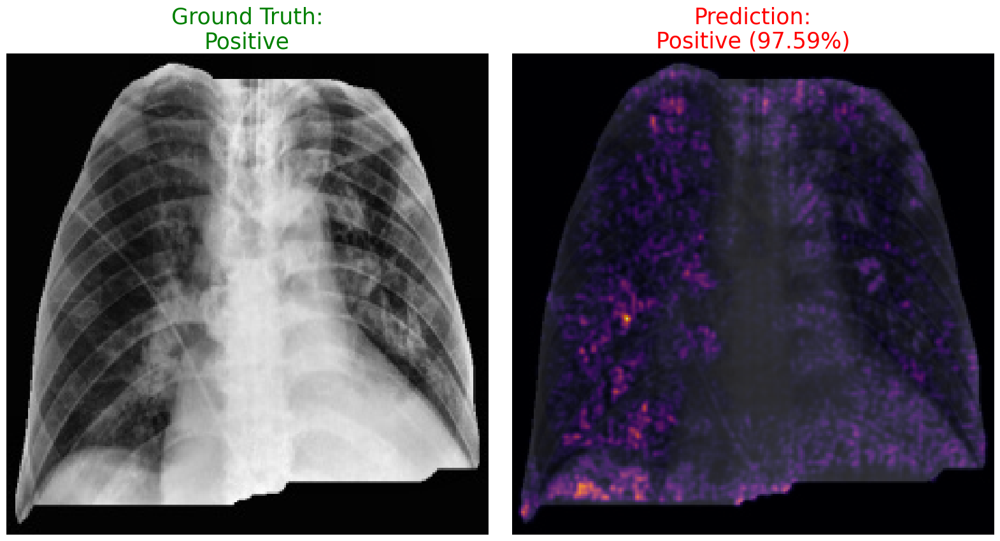

In [111]:
from torch.utils.data import DataLoader
loader = DataLoader(d_nih_test, batch_size=50, shuffle=True)

batch = next(iter(loader))
images = batch['img']
background_batch = images.repeat(1, 3, 1, 1).float().to(device)

print(f"Background batch shape: {background_batch.shape}")

explainer = shap.GradientExplainer(model, background_batch)
save_shap_positive_only(indices_dict['TP'][3], d_chex_test, model, explainer, sigma = 1, save_path="edema_TP_SHAP.png", target_class="Edema")

### Swin-B - Population

In [112]:
pc_png_test = PNGFolderDataset(img_dir="/home/varrel/imaging/all_images/PC_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/pc_test_split_filtered.csv",
    id_col="ImageID"
)

vindr_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/test_dataset/VinDr_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/vin_test_split.csv", id_col="image_id")

openi_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/Openi_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/openi_test_split_filtered.csv", id_col="filename")

d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_raw = xrv.datasets.NIH_Dataset(
    imgpath="/home/varrel/imaging/all_images/NIH_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/nih_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_mimic_raw = xrv.datasets.MIMIC_Dataset(
    imgpath="/home/varrel/imaging/all_images/MIMIC_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/mimic_test_split_xrv.csv",
    metacsvpath="/home/varrel/imaging/all_images/MIMIC_dataset/mimic-cxr-2.0.0-metadata.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_test = XRVCorrectionDataset(d_nih_raw)
d_chex_test = XRVCorrectionDataset(d_chex_raw)
d_mimic_test = XRVCorrectionDataset(d_mimic_raw)

classes = ['Edema']
xrv.datasets.relabel_dataset(classes, d_chex_test)
xrv.datasets.relabel_dataset(classes, d_nih_test)
xrv.datasets.relabel_dataset(classes, d_mimic_test)
xrv.datasets.relabel_dataset(classes, pc_png_test)
xrv.datasets.relabel_dataset(classes, vindr_png_test)
xrv.datasets.relabel_dataset(classes, openi_png_test)

dmerge_test = xrv.datasets.MergeDataset([
   d_chex_test, d_nih_test, d_mimic_test, 
    pc_png_test, openi_png_test, vindr_png_test
])

{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'Pleural_Thickening', 'Effusion', 'Cardiomegaly', 'Emphysema', 'Hernia', 'Mass', 'Nodule', 'Pneumothorax', 'Fibrosis', 'Infiltration', 'Consolidation', 'Pneumonia', 'Atelectasis'} will be dropped
{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'No Finding', 'Lung Opacity', 'Pneumonia', 'Pleural Effusion', 'Enlarged Cardio.', 'Cardiomegaly', 'Pneumothorax', 'Consolidation', 'Lung Lesion', 'Atelecta

In [113]:
indices_dict = find_tp_fp_indices(dmerge_test, model, threshold=0.659, target_class="Edema", limit=250, max_scan=70000)

Selecting 70000 RANDOM indices from 74494 total images...
Scanning to find 250 examples for TP and FP...


  6%|▌         | 3999/70000 [00:29<08:00, 137.32it/s]

Found enough examples for both TP and FP!

--- Scanning Complete ---
TP (True Pos):  250 found
FP (False Pos): 250 found


Total Positive Predictions: 500
Generating Smoothed Global SHAP Map for 500 images...


100%|██████████| 500/500 [07:47<00:00,  1.07it/s]


Applying Gaussian Smoothing (sigma=1)...
Saving to edema_population_shap_global.png...


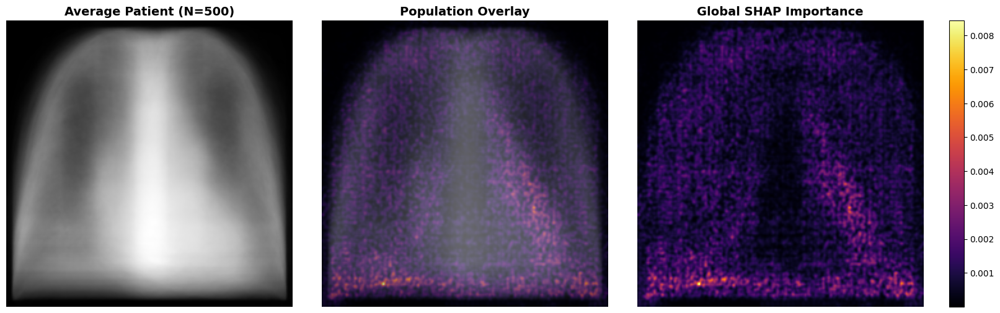

In [114]:
all_positive_preds = indices_dict['TP'] + indices_dict['FP']
print(f"Total Positive Predictions: {len(all_positive_preds)}")

generate_population_shap(all_positive_preds, dmerge_test, model, explainer, max_images=500, sigma=1, save_path="edema_population_shap_global.png")

# Pneumonia

In [50]:
d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_chex_test = XRVCorrectionDataset(d_chex_raw)

### Swin-B - CAM

In [52]:
# Load the model
weights = models.Swin_B_Weights.IMAGENET1K_V1
model = models.swin_b(weights=weights)
model.head = nn.Linear(model.head.in_features, 1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = "/home/varrel/image_model_dict/final/fixed_swinb_pneumonia_model_epoch2.pth"
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

if 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
else:
    model.load_state_dict(checkpoint)

model = model.to(device)
model.eval()

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=512, out_features=128, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock

In [53]:
indices_dict = find_confusion_matrix_indices(d_chex_test, model, target_class="Pneumonia", threshold=0.514, limit=10)

Scanning up to 2000 images to find 10 examples per category for 'Pneumonia'...
Using column: 'Pneumonia' for Ground Truth.


  0%|          | 70/19295 [00:00<02:30, 128.10it/s]

Found enough examples for all categories!

--- Scanning Complete ---
TP (True Pos):  [6, 11, 12, 14, 25, 27, 28, 29, 30, 45]
TN (True Neg):  [0, 1, 2, 3, 4, 5, 8, 15, 16, 17]
FP (False Pos): [7, 9, 10, 13, 19, 31, 63, 67, 68, 69]
FN (False Neg): [26, 44, 46, 47, 49, 56, 58, 60, 61, 62]


Saved viz_Positive_pneumonia.png


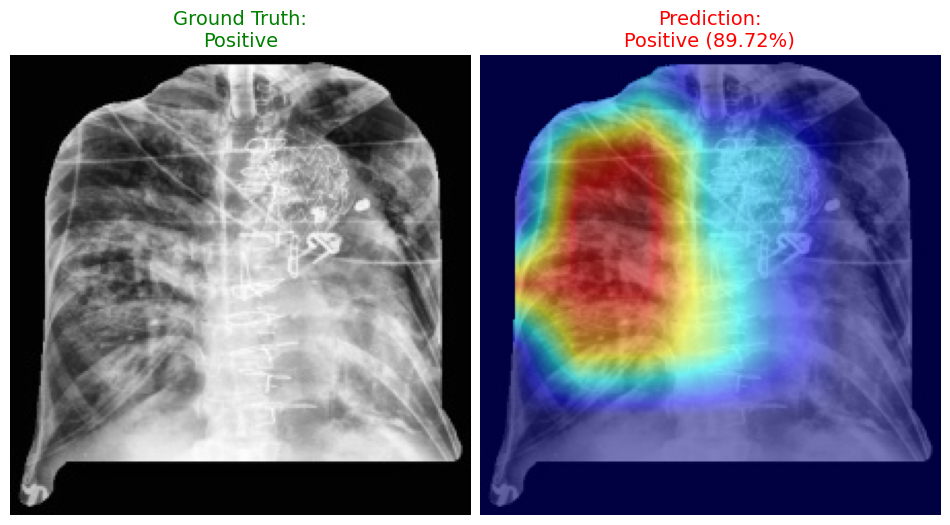

In [51]:
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

def reshape_transform(tensor):
    # Standard Swin-B output: (B, H, W, C) -> Permute to (B, C, H, W)
    if tensor.ndim == 4:
        return tensor.permute(0, 3, 1, 2)
    return tensor

# --- CONFIGURATION ---
INDEX = indices_dict['TP'][9]
DATASET = d_chex_test
TARGET_CLASS = "Pneumonia"
FLIP_MODE = None

sample = DATASET[INDEX]
img_xrv = sample['img']

gt_text = "Unknown"
is_positive = False

if hasattr(DATASET, 'csv'):
    if 'Pneumonia' in DATASET.csv.columns:
        val = DATASET.csv.iloc[INDEX]['Pneumonia']
        if not np.isnan(val):
            is_positive = (int(val) == 1)
            gt_text = "Positive" if is_positive else "Negative"
            
    elif 'Finding Labels' in DATASET.csv.columns:
        label_text = DATASET.csv.iloc[INDEX]['Finding Labels']
        is_positive = TARGET_CLASS in label_text
        gt_text = "Positive" if is_positive else "Negative"

img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)

rgb_img = np.repeat(img_norm.transpose(1, 2, 0), 3, axis=2)

input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

with torch.no_grad():
    output = model(input_tensor)
    prob = torch.sigmoid(output).item()

if prob < 0.5:
    pred_text = f"Negative ({prob:.2%})"
    color_pred = 'blue'
else:
    pred_text = f"Positive ({prob:.2%})"
    color_pred = 'red'

target_layers = [model.norm]
cam = EigenCAM(
    model=model, 
    target_layers=target_layers, 
    reshape_transform=reshape_transform
)
grayscale_cam = cam(input_tensor=input_tensor, targets=[BinaryClassifierOutputTarget(0)])[0, :]

if FLIP_MODE == 'transpose':
    grayscale_cam = grayscale_cam.T
elif FLIP_MODE == 'left-right':
    grayscale_cam = np.fliplr(grayscale_cam)
elif FLIP_MODE == 'up-down':
    grayscale_cam = np.flipud(grayscale_cam)
elif FLIP_MODE == 'rotate-180':
    grayscale_cam = np.rot90(grayscale_cam, 2)

norm_image_uint8 = (img_norm[0] * 255).astype(np.uint8)
_, binary_mask = cv2.threshold(norm_image_uint8, 15, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    mask = filled_mask.astype(np.float32) / 255.0
else:
    mask = np.ones_like(img_norm[0])

masked_cam = grayscale_cam * mask
masked_cam = masked_cam - masked_cam.min()
if masked_cam.max() > 0:
    masked_cam = masked_cam / masked_cam.max()

viz_masked = show_cam_on_image(rgb_img, masked_cam, use_rgb=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace': 0.02})

axes[0].imshow(rgb_img)
axes[0].set_title(f"Ground Truth:\n{gt_text}", fontsize=14, 
                  color='green' if gt_text == "Positive" else 'black')
axes[0].axis('off')

axes[1].imshow(viz_masked)
axes[1].set_title(f"Prediction:\n{pred_text}", fontsize=14, 
                  color=color_pred)
axes[1].axis('off')

# Final squeeze to minimize white space
plt.subplots_adjust(wspace=0.02)
plt.savefig(f'viz_{gt_text}_pneumonia.png', dpi=300, bbox_inches='tight')
print(f"Saved viz_{gt_text}_pneumonia.png")
plt.show()

### Swin-B - SHAP

Background batch shape: torch.Size([50, 3, 224, 224])
Calculating SHAP for Index 45...
Saving to pneumonia_TP_SHAP.png...


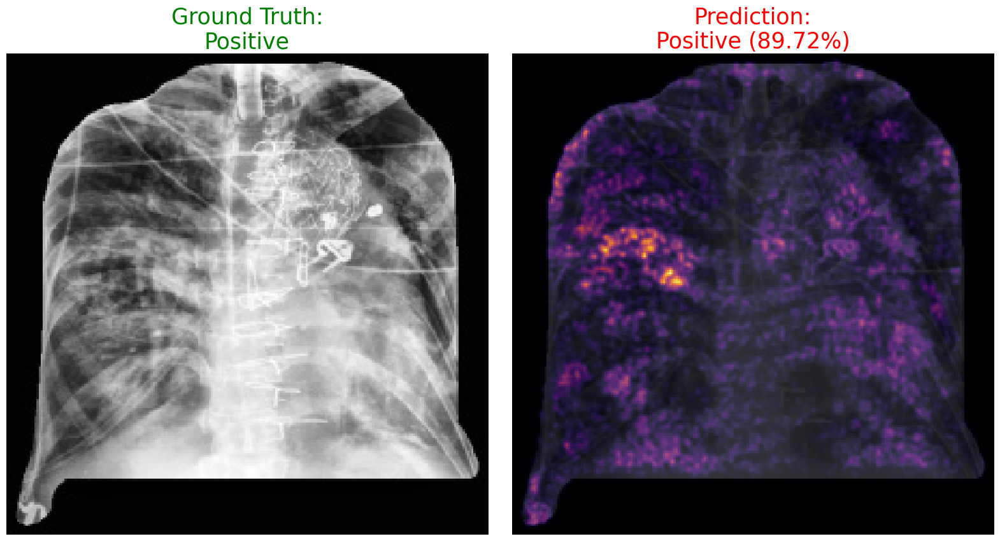

In [54]:
from torch.utils.data import DataLoader
loader = DataLoader(d_nih_test, batch_size=50, shuffle=True)

batch = next(iter(loader))
images = batch['img']
background_batch = images.repeat(1, 3, 1, 1).float().to(device)

print(f"Background batch shape: {background_batch.shape}")

explainer = shap.GradientExplainer(model, background_batch)
save_shap_positive_only(indices_dict['TP'][9], d_chex_test, model, explainer, sigma = 1, save_path="pneumonia_TP_SHAP.png", target_class="Pneumonia")

### Swin-B - Population

In [55]:
pc_png_test = PNGFolderDataset(img_dir="/home/varrel/imaging/all_images/PC_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/pc_test_split_filtered.csv",
    id_col="ImageID"
)

vindr_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/test_dataset/VinDr_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/vin_test_split.csv", id_col="image_id")

openi_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/Openi_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/openi_test_split_filtered.csv", id_col="filename")

pp_png_test = PNGFolderDataset(img_dir="/home/varrel/test_images/PP_dataset/images_all/test/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/pp_test_split.csv",
    id_col="image_id"
)

d_rsna_raw = xrv.datasets.RSNA_Pneumonia_Dataset(
    imgpath="/home/varrel/test_images/RSNA_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/rsna_test_split_xrv.csv",
    views=["PA","AP"])

d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_raw = xrv.datasets.NIH_Dataset(
    imgpath="/home/varrel/imaging/all_images/NIH_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/nih_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_mimic_raw = xrv.datasets.MIMIC_Dataset(
    imgpath="/home/varrel/imaging/all_images/MIMIC_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/mimic_test_split_xrv.csv",
    metacsvpath="/home/varrel/imaging/all_images/MIMIC_dataset/mimic-cxr-2.0.0-metadata.csv",
    views=["PA","AP"], unique_patients=False)

d_rsna_test = XRVCorrectionDataset(d_rsna_raw)
d_nih_test = XRVCorrectionDataset(d_nih_raw)
d_chex_test = XRVCorrectionDataset(d_chex_raw)
d_mimic_test = XRVCorrectionDataset(d_mimic_raw)

classes = ['Pneumonia']
xrv.datasets.relabel_dataset(classes, d_rsna_test)
xrv.datasets.relabel_dataset(classes, d_chex_test)
xrv.datasets.relabel_dataset(classes, d_nih_test)
xrv.datasets.relabel_dataset(classes, d_mimic_test)
xrv.datasets.relabel_dataset(classes, pp_png_test)
xrv.datasets.relabel_dataset(classes, pc_png_test)
xrv.datasets.relabel_dataset(classes, vindr_png_test)
xrv.datasets.relabel_dataset(classes, openi_png_test)

dmerge_test = xrv.datasets.MergeDataset([
    d_rsna_test, d_chex_test, d_nih_test, d_mimic_test, 
    pp_png_test, pc_png_test, openi_png_test, vindr_png_test
])

{'Lung Opacity'} will be dropped
{np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'Pleural_Thickening', 'Effusion', 'Cardiomegaly', 'Emphysema', 'Hernia', 'Mass', 'Nodule', 'Pneumothorax', 'Fibrosis', 'Infiltration', 'Consolidation', 'Atelectasis', 'Edema'} will be dropped
{np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'No Finding', 'Lung Opacity', 'Pleural Effusion', 'Enlarged Cardio.', 'Cardiomegaly', 'Pneumothorax', 'Consolidation', 'Lung Lesion', '

In [56]:
indices_dict = find_tp_fp_indices(dmerge_test, model, threshold=0.514, target_class="Pneumonia", limit=250, max_scan=70000)

Selecting 70000 RANDOM indices from 77787 total images...
Scanning to find 250 examples for TP and FP...


  7%|▋         | 4586/70000 [01:19<18:52, 57.76it/s] 

Found enough examples for both TP and FP!

--- Scanning Complete ---
TP (True Pos):  250 found
FP (False Pos): 250 found


Total Positive Predictions: 500
Generating Smoothed Global SHAP Map for 500 images...


100%|██████████| 500/500 [07:48<00:00,  1.07it/s]


Applying Gaussian Smoothing (sigma=1)...
Saving to pneumonia_population_shap_global.png...


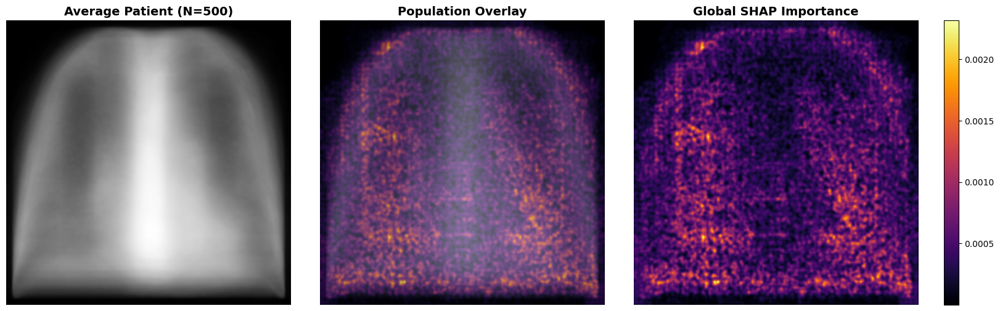

In [57]:
all_positive_preds = indices_dict['TP'] + indices_dict['FP']
print(f"Total Positive Predictions: {len(all_positive_preds)}")

generate_population_shap(all_positive_preds, dmerge_test, model, explainer, max_images=500, sigma=1, save_path="pneumonia_population_shap_global.png")

# Pneumothorax

In [101]:
d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_chex_test = XRVCorrectionDataset(d_chex_raw)

### Swin-B - CAM

In [102]:
# Load the model
weights = models.Swin_B_Weights.IMAGENET1K_V1
model = models.swin_b(weights=weights)
model.head = nn.Linear(model.head.in_features, 1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = "/home/varrel/image_model_dict/final/fixed_swinb_pneumothorax_model_epoch9.pth"
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

if 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
else:
    model.load_state_dict(checkpoint)

model = model.to(device)
model.eval()

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=512, out_features=128, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock

In [103]:
indices_dict = find_confusion_matrix_indices(d_chex_test, model, target_class="Pneumothorax", threshold=0.5, limit=10)

Scanning up to 2000 images to find 10 examples per category for 'Pneumothorax'...
Using column: 'Pneumothorax' for Ground Truth.


  1%|          | 238/19295 [00:01<02:29, 127.24it/s]

Found enough examples for all categories!

--- Scanning Complete ---
TP (True Pos):  [8, 9, 10, 11, 14, 15, 34, 35, 39, 41]
TN (True Neg):  [0, 1, 2, 3, 5, 7, 16, 17, 18, 19]
FP (False Pos): [29, 33, 38, 52, 67, 107, 176, 182, 196, 237]
FN (False Neg): [4, 6, 12, 13, 23, 36, 37, 40, 62, 64]


Saved viz_Positive_pneumothorax.png


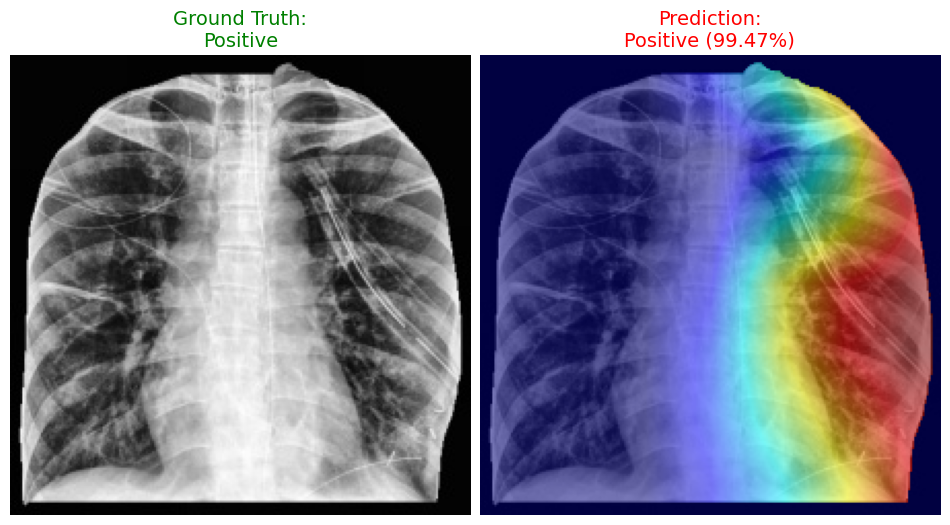

In [59]:
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

def reshape_transform(tensor):
    # Standard Swin-B output: (B, H, W, C) -> Permute to (B, C, H, W)
    if tensor.ndim == 4:
        return tensor.permute(0, 3, 1, 2)
    return tensor

# --- CONFIGURATION ---
INDEX = indices_dict['TP'][5]
DATASET = d_chex_test
TARGET_CLASS = "Pneumothorax"
FLIP_MODE = None

sample = DATASET[INDEX]
img_xrv = sample['img']

gt_text = "Unknown"
is_positive = False

if hasattr(DATASET, 'csv'):
    if 'Pneumothorax' in DATASET.csv.columns:
        val = DATASET.csv.iloc[INDEX]['Pneumothorax']
        if not np.isnan(val):
            is_positive = (int(val) == 1)
            gt_text = "Positive" if is_positive else "Negative"
            
    elif 'Finding Labels' in DATASET.csv.columns:
        label_text = DATASET.csv.iloc[INDEX]['Finding Labels']
        is_positive = TARGET_CLASS in label_text
        gt_text = "Positive" if is_positive else "Negative"

img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)

rgb_img = np.repeat(img_norm.transpose(1, 2, 0), 3, axis=2)

input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

with torch.no_grad():
    output = model(input_tensor)
    prob = torch.sigmoid(output).item()

if prob < 0.5:
    pred_text = f"Negative ({prob:.2%})"
    color_pred = 'blue'
else:
    pred_text = f"Positive ({prob:.2%})"
    color_pred = 'red'

target_layers = [model.norm]
cam = EigenCAM(
    model=model, 
    target_layers=target_layers, 
    reshape_transform=reshape_transform
)
grayscale_cam = cam(input_tensor=input_tensor, targets=[BinaryClassifierOutputTarget(0)])[0, :]

if FLIP_MODE == 'transpose':
    grayscale_cam = grayscale_cam.T
elif FLIP_MODE == 'left-right':
    grayscale_cam = np.fliplr(grayscale_cam)
elif FLIP_MODE == 'up-down':
    grayscale_cam = np.flipud(grayscale_cam)
elif FLIP_MODE == 'rotate-180':
    grayscale_cam = np.rot90(grayscale_cam, 2)

norm_image_uint8 = (img_norm[0] * 255).astype(np.uint8)
_, binary_mask = cv2.threshold(norm_image_uint8, 15, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    mask = filled_mask.astype(np.float32) / 255.0
else:
    mask = np.ones_like(img_norm[0])

masked_cam = grayscale_cam * mask
masked_cam = masked_cam - masked_cam.min()
if masked_cam.max() > 0:
    masked_cam = masked_cam / masked_cam.max()

viz_masked = show_cam_on_image(rgb_img, masked_cam, use_rgb=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace': 0.02})

axes[0].imshow(rgb_img)
axes[0].set_title(f"Ground Truth:\n{gt_text}", fontsize=14, 
                  color='green' if gt_text == "Positive" else 'black')
axes[0].axis('off')

axes[1].imshow(viz_masked)
axes[1].set_title(f"Prediction:\n{pred_text}", fontsize=14, 
                  color=color_pred)
axes[1].axis('off')

plt.subplots_adjust(wspace=0.02)
plt.savefig(f'viz_{gt_text}_pneumothorax.png', dpi=300, bbox_inches='tight')
print(f"Saved viz_{gt_text}_pneumothorax.png")
plt.show()

### Swin-B - SHAP

Background batch shape: torch.Size([50, 3, 224, 224])
Calculating SHAP for Index 15...
Saving to pneumothorax_TP_SHAP.png...


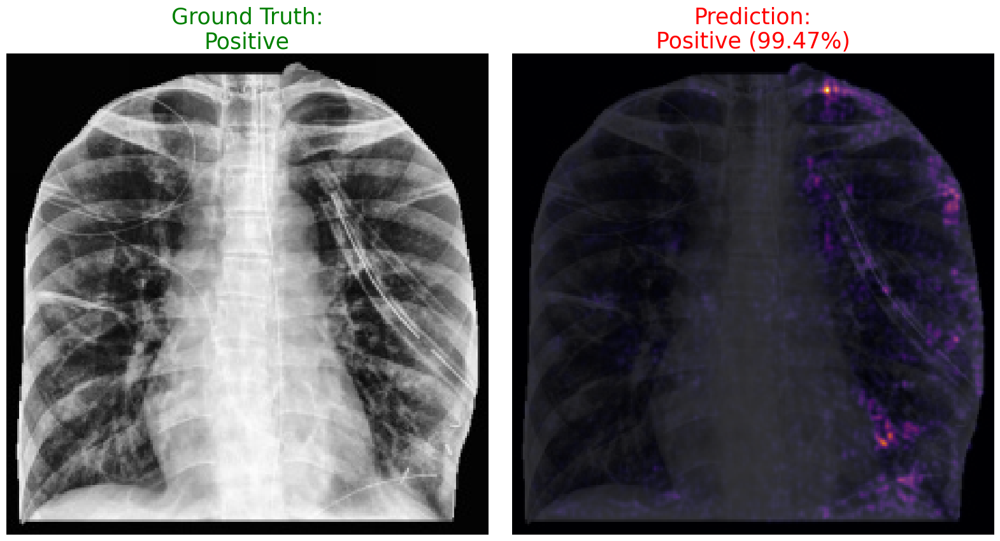

In [104]:
from torch.utils.data import DataLoader
loader = DataLoader(d_nih_test, batch_size=50, shuffle=True)

batch = next(iter(loader))
images = batch['img']
background_batch = images.repeat(1, 3, 1, 1).float().to(device)

print(f"Background batch shape: {background_batch.shape}")

explainer = shap.GradientExplainer(model, background_batch)
save_shap_positive_only(indices_dict['TP'][5], d_chex_test, model, explainer, sigma = 1, save_path="pneumothorax_TP_SHAP.png", target_class="Pneumothorax")

### Swin-B - Population

In [105]:
pc_png_test = PNGFolderDataset(img_dir="/home/varrel/imaging/all_images/PC_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/pc_test_split_filtered.csv",
    id_col="ImageID"
)

vindr_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/test_dataset/VinDr_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/vin_test_split.csv", id_col="image_id")

openi_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/Openi_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/openi_test_split_filtered.csv", id_col="filename")

siim_png_test = PNGFolderDataset(
    img_dir="/home/varrel/imaging/all_images/SIIM_dataset/flat_png7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/siim_test_split.csv",
    id_col="ImageId"
)

d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_raw = xrv.datasets.NIH_Dataset(
    imgpath="/home/varrel/imaging/all_images/NIH_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/nih_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_mimic_raw = xrv.datasets.MIMIC_Dataset(
    imgpath="/home/varrel/imaging/all_images/MIMIC_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/mimic_test_split_xrv.csv",
    metacsvpath="/home/varrel/imaging/all_images/MIMIC_dataset/mimic-cxr-2.0.0-metadata.csv",
    views=["PA","AP"], unique_patients=False)

d_rsna_test = XRVCorrectionDataset(d_rsna_raw)
d_nih_test = XRVCorrectionDataset(d_nih_raw)
d_chex_test = XRVCorrectionDataset(d_chex_raw)
d_mimic_test = XRVCorrectionDataset(d_mimic_raw)

classes = ['Pneumothorax']
xrv.datasets.relabel_dataset(classes, d_chex_test)
xrv.datasets.relabel_dataset(classes, d_nih_test)
xrv.datasets.relabel_dataset(classes, d_mimic_test)
xrv.datasets.relabel_dataset(classes, siim_png_test)
xrv.datasets.relabel_dataset(classes, pc_png_test)
xrv.datasets.relabel_dataset(classes, vindr_png_test)
xrv.datasets.relabel_dataset(classes, openi_png_test)

dmerge_test = xrv.datasets.MergeDataset([
    d_chex_test, d_nih_test, d_mimic_test, 
    siim_png_test, pc_png_test, openi_png_test, vindr_png_test
])

{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'Pleural_Thickening', 'Effusion', 'Cardiomegaly', 'Emphysema', 'Hernia', 'Mass', 'Nodule', 'Fibrosis', 'Infiltration', 'Consolidation', 'Pneumonia', 'Atelectasis', 'Edema'} will be dropped
{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'No Finding', 'Lung Opacity', 'Pneumonia', 'Pleural Effusion', 'Enlarged Cardio.', 'Cardiomegaly', 'Consolidation', 'Lung Lesion', 'Atelectasis', 'Fracture', 'Edema', 'Support D

In [106]:
indices_dict = find_tp_fp_indices(dmerge_test, model, threshold=0.514, target_class="Pneumothorax", limit=250, max_scan=70000)

Selecting 70000 RANDOM indices from 75699 total images...
Scanning to find 250 examples for TP and FP...


 19%|█▉        | 13391/70000 [01:47<07:32, 124.97it/s]

Found enough examples for both TP and FP!

--- Scanning Complete ---
TP (True Pos):  250 found
FP (False Pos): 250 found


Total Positive Predictions: 500
Generating Smoothed Global SHAP Map for 500 images...


100%|██████████| 500/500 [07:47<00:00,  1.07it/s]


Applying Gaussian Smoothing (sigma=1)...
Saving to pneumothorax_population_shap_global.png...


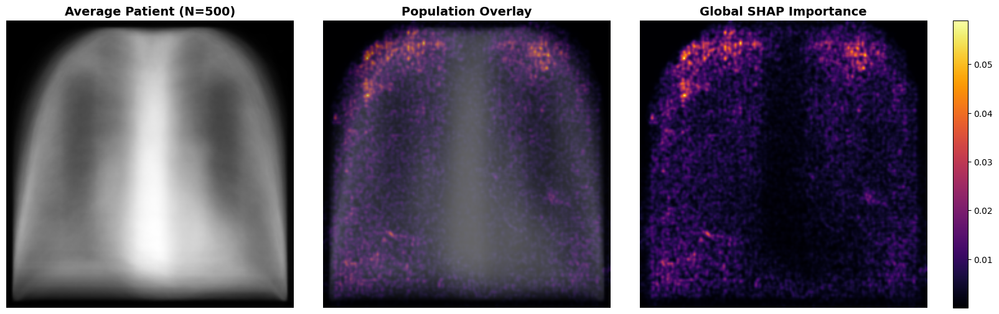

In [107]:
all_positive_preds = indices_dict['TP'] + indices_dict['FP']
print(f"Total Positive Predictions: {len(all_positive_preds)}")

generate_population_shap(all_positive_preds, dmerge_test, model, explainer, max_images=500, sigma=1, save_path="pneumothorax_population_shap_global.png")

# Enlarged Cardiomediastinum

In [71]:
d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_chex_test = XRVCorrectionDataset(d_chex_raw)

### Swin-B - CAM

In [72]:
# Load the model
weights = models.Swin_B_Weights.IMAGENET1K_V1
model = models.swin_b(weights=weights)
model.head = nn.Linear(model.head.in_features, 1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = "/home/varrel/image_model_dict/final/fixed_swinb_enlarged_model_epoch7.pth"
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

if 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
else:
    model.load_state_dict(checkpoint)

model = model.to(device)
model.eval()

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=512, out_features=128, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock

In [73]:
indices_dict = find_confusion_matrix_indices(d_chex_test, model, target_class="Enlarged Cardiomediastinum", threshold=0.750, limit=10)

Scanning up to 2000 images to find 10 examples per category for 'Enlarged Cardiomediastinum'...
Using column: 'Enlarged Cardiomediastinum' for Ground Truth.


  1%|          | 241/19295 [00:02<02:56, 107.97it/s]

Found enough examples for all categories!

--- Scanning Complete ---
TP (True Pos):  [3, 4, 5, 6, 9, 11, 18, 19, 20, 21]
TN (True Neg):  [0, 1, 2, 8, 15, 16, 32, 34, 35, 36]
FP (False Pos): [10, 12, 13, 17, 39, 70, 115, 121, 127, 137]
FN (False Neg): [7, 14, 33, 42, 96, 111, 154, 167, 212, 240]


Saved viz_Positive_enlarged.png


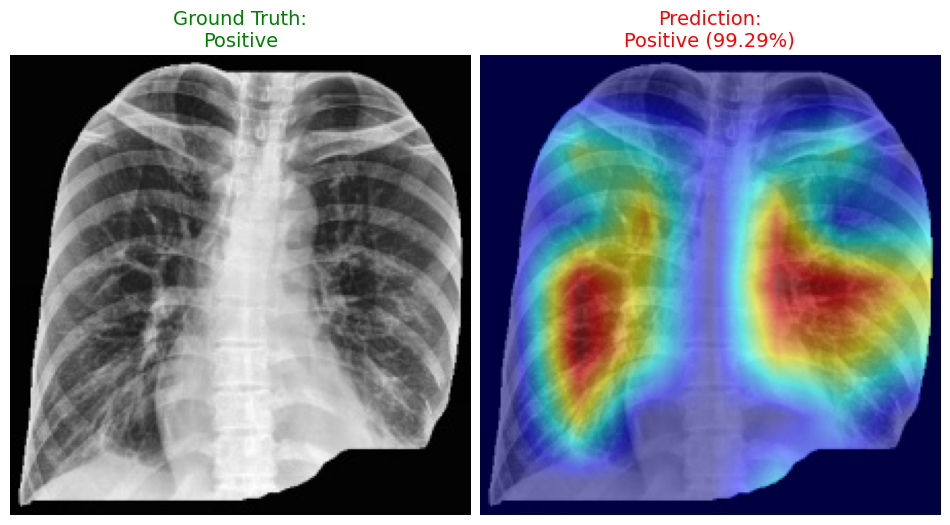

In [67]:
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

def reshape_transform(tensor):
    # Standard Swin-B output: (B, H, W, C) -> Permute to (B, C, H, W)
    if tensor.ndim == 4:
        return tensor.permute(0, 3, 1, 2)
    return tensor

# --- CONFIGURATION ---
INDEX = indices_dict['TP'][5]
DATASET = d_chex_test
TARGET_CLASS = "Enlarged Cardiomediastinum"
FLIP_MODE = None

sample = DATASET[INDEX]
img_xrv = sample['img']

gt_text = "Unknown"
is_positive = False

if hasattr(DATASET, 'csv'):
    if 'Enlarged Cardiomediastinum' in DATASET.csv.columns:
        val = DATASET.csv.iloc[INDEX]['Enlarged Cardiomediastinum']
        if not np.isnan(val):
            is_positive = (int(val) == 1)
            gt_text = "Positive" if is_positive else "Negative"
            
    elif 'Finding Labels' in DATASET.csv.columns:
        label_text = DATASET.csv.iloc[INDEX]['Finding Labels']
        is_positive = TARGET_CLASS in label_text
        gt_text = "Positive" if is_positive else "Negative"

img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)

rgb_img = np.repeat(img_norm.transpose(1, 2, 0), 3, axis=2)

input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

with torch.no_grad():
    output = model(input_tensor)
    prob = torch.sigmoid(output).item()

if prob < 0.5:
    pred_text = f"Negative ({prob:.2%})"
    color_pred = 'blue'
else:
    pred_text = f"Positive ({prob:.2%})"
    color_pred = 'red'

target_layers = [model.norm]
cam = EigenCAM(
    model=model, 
    target_layers=target_layers, 
    reshape_transform=reshape_transform
)
grayscale_cam = cam(input_tensor=input_tensor, targets=[BinaryClassifierOutputTarget(0)])[0, :]

if FLIP_MODE == 'transpose':
    grayscale_cam = grayscale_cam.T
elif FLIP_MODE == 'left-right':
    grayscale_cam = np.fliplr(grayscale_cam)
elif FLIP_MODE == 'up-down':
    grayscale_cam = np.flipud(grayscale_cam)
elif FLIP_MODE == 'rotate-180':
    grayscale_cam = np.rot90(grayscale_cam, 2)

norm_image_uint8 = (img_norm[0] * 255).astype(np.uint8)
_, binary_mask = cv2.threshold(norm_image_uint8, 15, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    mask = filled_mask.astype(np.float32) / 255.0
else:
    mask = np.ones_like(img_norm[0])

masked_cam = grayscale_cam * mask
masked_cam = masked_cam - masked_cam.min()
if masked_cam.max() > 0:
    masked_cam = masked_cam / masked_cam.max()

viz_masked = show_cam_on_image(rgb_img, masked_cam, use_rgb=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace': 0.02})

axes[0].imshow(rgb_img)
axes[0].set_title(f"Ground Truth:\n{gt_text}", fontsize=14, 
                  color='green' if gt_text == "Positive" else 'black')
axes[0].axis('off')

axes[1].imshow(viz_masked)
axes[1].set_title(f"Prediction:\n{pred_text}", fontsize=14, 
                  color=color_pred)
axes[1].axis('off')

plt.subplots_adjust(wspace=0.02)
plt.savefig(f'viz_{gt_text}_enlarged.png', dpi=300, bbox_inches='tight')
print(f"Saved viz_{gt_text}_enlarged.png")
plt.show()

### Swin-B - SHAP

Background batch shape: torch.Size([50, 3, 224, 224])
Calculating SHAP for Index 5...
Saving to enlarged_TP_SHAP.png...


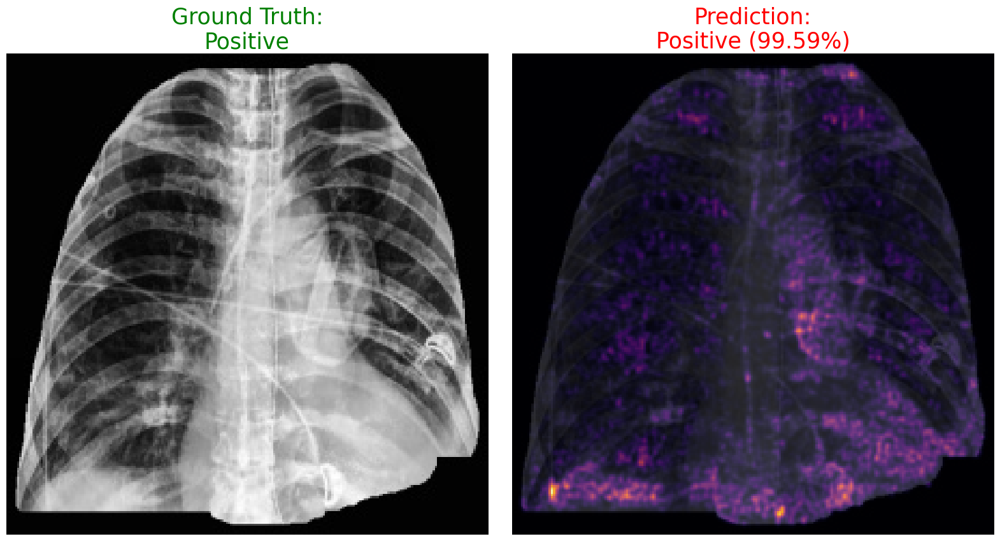

In [74]:
from torch.utils.data import DataLoader
loader = DataLoader(d_nih_test, batch_size=50, shuffle=True)

batch = next(iter(loader))
images = batch['img']
background_batch = images.repeat(1, 3, 1, 1).float().to(device)

print(f"Background batch shape: {background_batch.shape}")

explainer = shap.GradientExplainer(model, background_batch)
save_shap_positive_only(indices_dict['TP'][2], d_chex_test, model, explainer, sigma = 1, save_path="enlarged_TP_SHAP.png", target_class="Enlarged Cardiomediastinum")

### Swin-B - Population

In [75]:
pc_png_test = PNGFolderDataset(img_dir="/home/varrel/imaging/all_images/PC_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/pc_test_split_filtered.csv",
    id_col="ImageID"
)

openi_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/Openi_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/openi_test_split_filtered.csv", id_col="filename")

d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_mimic_raw = xrv.datasets.MIMIC_Dataset(
    imgpath="/home/varrel/imaging/all_images/MIMIC_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/mimic_test_split_xrv.csv",
    metacsvpath="/home/varrel/imaging/all_images/MIMIC_dataset/mimic-cxr-2.0.0-metadata.csv",
    views=["PA","AP"], unique_patients=False)

d_chex_test = XRVCorrectionDataset(d_chex_raw)
d_mimic_test = XRVCorrectionDataset(d_mimic_raw)

classes = ['Enlarged Cardiomediastinum']
pc_png_test.pathologies = [
    "Enlarged Cardiomediastinum" if p == "Enlarged Cardio." else p
    for p in pc_png_test.pathologies
]
openi_png_test.pathologies = [
    "Enlarged Cardiomediastinum" if p == "Enlarged Cardio." else p
    for p in openi_png_test.pathologies
]
xrv.datasets.relabel_dataset(classes, d_chex_test)
xrv.datasets.relabel_dataset(classes, d_mimic_test)
xrv.datasets.relabel_dataset(classes, pc_png_test)
xrv.datasets.relabel_dataset(classes, openi_png_test)

dmerge_test = xrv.datasets.MergeDataset([
    d_chex_test, d_mimic_test, 
    pc_png_test, openi_png_test
])

{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'No Finding', 'Lung Opacity', 'Pneumonia', 'Pleural Effusion', 'Cardiomegaly', 'Pneumothorax', 'Consolidation', 'Lung Lesion', 'Atelectasis', 'Fracture', 'Edema', 'Support Devices'} will be dropped
{'No Finding', 'Lung Opacity', 'Pneumonia', 'Pleural Effusion', 'Cardiomegaly', 'Pneumothorax', 'Consolidation', 'Lung Lesion', 'Atelectasis', 'Fracture', 'Edema', 'Support Devices'} will be droppe

In [76]:
indices_dict = find_tp_fp_indices(dmerge_test, model, threshold=0.700, target_class="Enlarged Cardiomediastinum", limit=250, max_scan=70000)

Selecting 60433 RANDOM indices from 60433 total images...
Scanning to find 250 examples for TP and FP...


 11%|█         | 6442/60433 [01:13<10:18, 87.30it/s] 

Found enough examples for both TP and FP!

--- Scanning Complete ---
TP (True Pos):  250 found
FP (False Pos): 250 found


Total Positive Predictions: 500
Generating Smoothed Global SHAP Map for 500 images...


100%|██████████| 500/500 [07:47<00:00,  1.07it/s]


Applying Gaussian Smoothing (sigma=1)...
Saving to enlarged_population_shap_global.png...


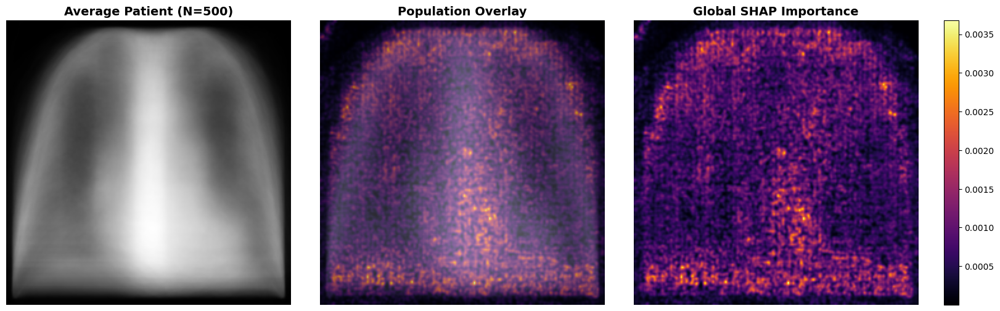

In [77]:
all_positive_preds = indices_dict['TP'] + indices_dict['FP']
print(f"Total Positive Predictions: {len(all_positive_preds)}")

generate_population_shap(all_positive_preds, dmerge_test, model, explainer, max_images=500, sigma=1, save_path="enlarged_population_shap_global.png")

# Opacity

In [115]:
d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_chex_test = XRVCorrectionDataset(d_chex_raw)

### Swin-B - CAM

In [116]:
# Load the model
weights = models.Swin_B_Weights.IMAGENET1K_V1
model = models.swin_b(weights=weights)
model.head = nn.Linear(model.head.in_features, 1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = "/home/varrel/image_model_dict/final/fixed_swinb_opacity_model_epoch7.pth"
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

if 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
else:
    model.load_state_dict(checkpoint)

model = model.to(device)
model.eval()

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=512, out_features=128, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock

In [117]:
indices_dict = find_confusion_matrix_indices(d_chex_test, model, target_class="Lung Opacity", threshold=0.530, limit=10)

Scanning up to 2000 images to find 10 examples per category for 'Lung Opacity'...
Using column: 'Lung Opacity' for Ground Truth.


  1%|          | 201/19295 [00:01<02:29, 127.84it/s]

Found enough examples for all categories!

--- Scanning Complete ---
TP (True Pos):  [3, 4, 5, 6, 7, 9, 10, 11, 12, 13]
TN (True Neg):  [0, 1, 2, 16, 17, 32, 33, 34, 35, 36]
FP (False Pos): [8, 39, 116, 137, 142, 168, 169, 175, 176, 182]
FN (False Neg): [77, 78, 82, 99, 133, 151, 156, 177, 178, 200]


Saved viz_Positive_opacity.png


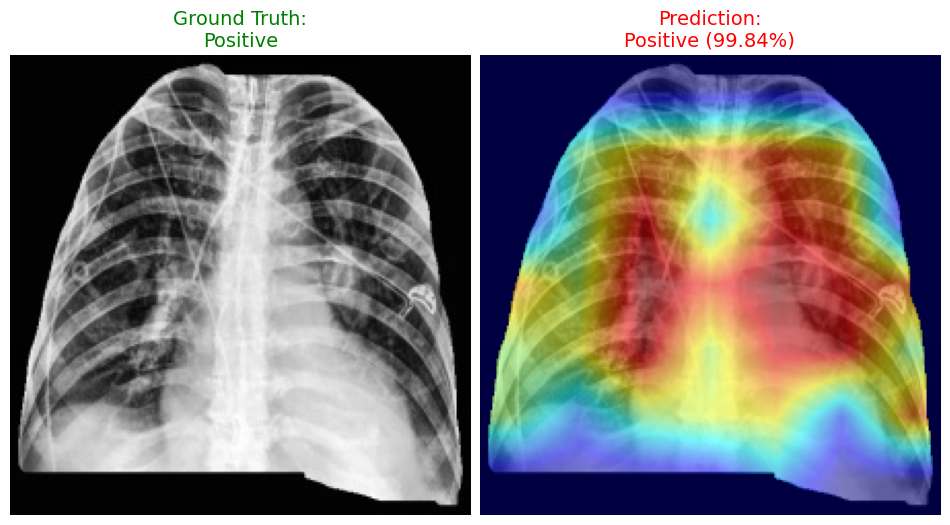

In [75]:
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

def reshape_transform(tensor):
    # Standard Swin-B output: (B, H, W, C) -> Permute to (B, C, H, W)
    if tensor.ndim == 4:
        return tensor.permute(0, 3, 1, 2)
    return tensor

# --- CONFIGURATION ---
INDEX = indices_dict['TP'][1]
DATASET = d_chex_test
TARGET_CLASS = "Lung Opacity"
FLIP_MODE = None

sample = DATASET[INDEX]
img_xrv = sample['img']

gt_text = "Unknown"
is_positive = False

if hasattr(DATASET, 'csv'):
    if 'Lung Opacity' in DATASET.csv.columns:
        val = DATASET.csv.iloc[INDEX]['Lung Opacity']
        if not np.isnan(val):
            is_positive = (int(val) == 1)
            gt_text = "Positive" if is_positive else "Negative"
            
    elif 'Finding Labels' in DATASET.csv.columns:
        label_text = DATASET.csv.iloc[INDEX]['Finding Labels']
        is_positive = TARGET_CLASS in label_text
        gt_text = "Positive" if is_positive else "Negative"

img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)

rgb_img = np.repeat(img_norm.transpose(1, 2, 0), 3, axis=2)

input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

with torch.no_grad():
    output = model(input_tensor)
    prob = torch.sigmoid(output).item()

if prob < 0.5:
    pred_text = f"Negative ({prob:.2%})"
    color_pred = 'blue'
else:
    pred_text = f"Positive ({prob:.2%})"
    color_pred = 'red'

target_layers = [model.norm]
cam = EigenCAM(
    model=model, 
    target_layers=target_layers, 
    reshape_transform=reshape_transform
)
grayscale_cam = cam(input_tensor=input_tensor, targets=[BinaryClassifierOutputTarget(0)])[0, :]

if FLIP_MODE == 'transpose':
    grayscale_cam = grayscale_cam.T
elif FLIP_MODE == 'left-right':
    grayscale_cam = np.fliplr(grayscale_cam)
elif FLIP_MODE == 'up-down':
    grayscale_cam = np.flipud(grayscale_cam)
elif FLIP_MODE == 'rotate-180':
    grayscale_cam = np.rot90(grayscale_cam, 2)

norm_image_uint8 = (img_norm[0] * 255).astype(np.uint8)
_, binary_mask = cv2.threshold(norm_image_uint8, 15, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    mask = filled_mask.astype(np.float32) / 255.0
else:
    mask = np.ones_like(img_norm[0])

masked_cam = grayscale_cam * mask
masked_cam = masked_cam - masked_cam.min()
if masked_cam.max() > 0:
    masked_cam = masked_cam / masked_cam.max()

viz_masked = show_cam_on_image(rgb_img, masked_cam, use_rgb=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace': 0.02})

axes[0].imshow(rgb_img)
axes[0].set_title(f"Ground Truth:\n{gt_text}", fontsize=14, 
                  color='green' if gt_text == "Positive" else 'black')
axes[0].axis('off')

axes[1].imshow(viz_masked)
axes[1].set_title(f"Prediction:\n{pred_text}", fontsize=14, 
                  color=color_pred)
axes[1].axis('off')

plt.subplots_adjust(wspace=0.02)
plt.savefig(f'viz_{gt_text}_opacity.png', dpi=300, bbox_inches='tight')
print(f"Saved viz_{gt_text}_opacity.png")
plt.show()

### Swin-B - SHAP

Background batch shape: torch.Size([50, 3, 224, 224])
Calculating SHAP for Index 4...
Saving to opacity_TP_SHAP.png...


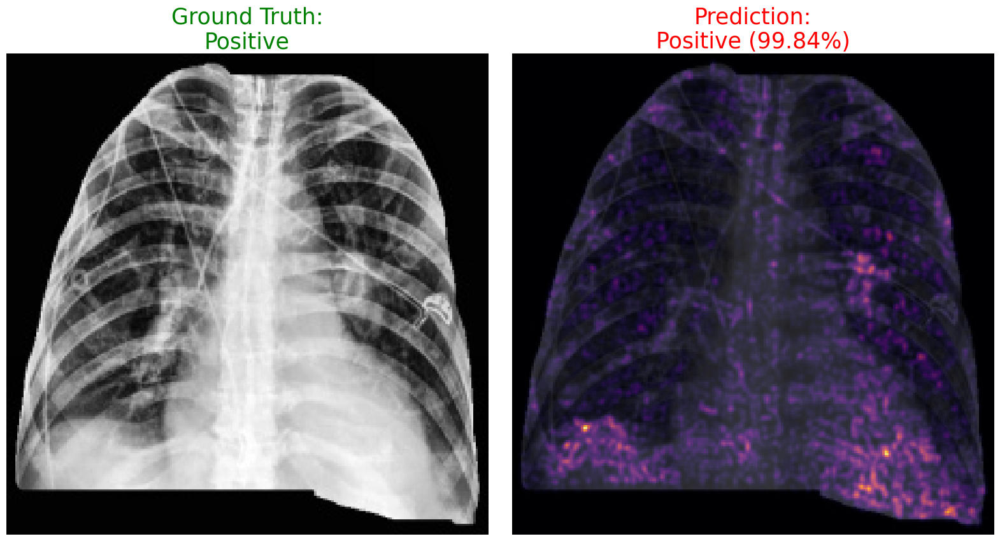

In [118]:
from torch.utils.data import DataLoader
loader = DataLoader(d_nih_test, batch_size=50, shuffle=True)

batch = next(iter(loader))
images = batch['img']
background_batch = images.repeat(1, 3, 1, 1).float().to(device)

print(f"Background batch shape: {background_batch.shape}")

explainer = shap.GradientExplainer(model, background_batch)
save_shap_positive_only(indices_dict['TP'][1], d_chex_test, model, explainer, sigma = 1, save_path="opacity_TP_SHAP.png", target_class="Lung Opacity")

### Swin-B - Population

In [119]:
pc_png_test = PNGFolderDataset(img_dir="/home/varrel/imaging/all_images/PC_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/pc_test_split_filtered.csv",
    id_col="ImageID"
)

vindr_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/test_dataset/VinDr_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/vin_test_split.csv", id_col="image_id")

openi_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/Openi_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/openi_test_split_filtered.csv", id_col="filename")

d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_raw = xrv.datasets.NIH_Dataset(
    imgpath="/home/varrel/imaging/all_images/NIH_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/nih_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_mimic_raw = xrv.datasets.MIMIC_Dataset(
    imgpath="/home/varrel/imaging/all_images/MIMIC_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/mimic_test_split_xrv.csv",
    metacsvpath="/home/varrel/imaging/all_images/MIMIC_dataset/mimic-cxr-2.0.0-metadata.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_raw.pathologies = [
    "Lung Opacity" if p == "Infiltration" else p
    for p in d_nih_raw.pathologies
]
d_nih_test = XRVCorrectionDataset(d_nih_raw)
d_chex_test = XRVCorrectionDataset(d_chex_raw)
d_mimic_test = XRVCorrectionDataset(d_mimic_raw)

classes = ['Lung Opacity']
xrv.datasets.relabel_dataset(classes, d_chex_test)
xrv.datasets.relabel_dataset(classes, d_nih_test)
xrv.datasets.relabel_dataset(classes, d_mimic_test)
xrv.datasets.relabel_dataset(classes, pc_png_test)
xrv.datasets.relabel_dataset(classes, vindr_png_test)
xrv.datasets.relabel_dataset(classes, openi_png_test)

dmerge_test = xrv.datasets.MergeDataset([
    d_chex_test, d_nih_test, d_mimic_test, 
    pc_png_test, openi_png_test, vindr_png_test
])

{np.str_('Pneumonia'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'Pleural_Thickening', 'Effusion', 'Cardiomegaly', 'Emphysema', 'Hernia', 'Mass', 'Nodule', 'Pneumothorax', 'Fibrosis', 'Consolidation', 'Pneumonia', 'Atelectasis', 'Edema'} will be dropped
{np.str_('Pneumonia'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'No Finding', 'Pneumonia', 'Pleural Effusion', 'Enlarged Cardio.', 'Cardiomegaly', 'Pneumothorax', 'Consolidation', 'Lung Lesion', 'Atelectasis', 'Fracture', 'Edema', 'Support D

In [120]:
indices_dict = find_tp_fp_indices(dmerge_test, model, threshold=0.530, target_class="Lung Opacity", limit=250, max_scan=70000)

Selecting 70000 RANDOM indices from 74494 total images...
Scanning to find 250 examples for TP and FP...


  3%|▎         | 2391/70000 [00:16<07:47, 144.70it/s]

Found enough examples for both TP and FP!

--- Scanning Complete ---
TP (True Pos):  250 found
FP (False Pos): 250 found


Total Positive Predictions: 500
Generating Smoothed Global SHAP Map for 500 images...


100%|██████████| 500/500 [07:48<00:00,  1.07it/s]


Applying Gaussian Smoothing (sigma=1)...
Saving to opacity_population_shap_global.png...


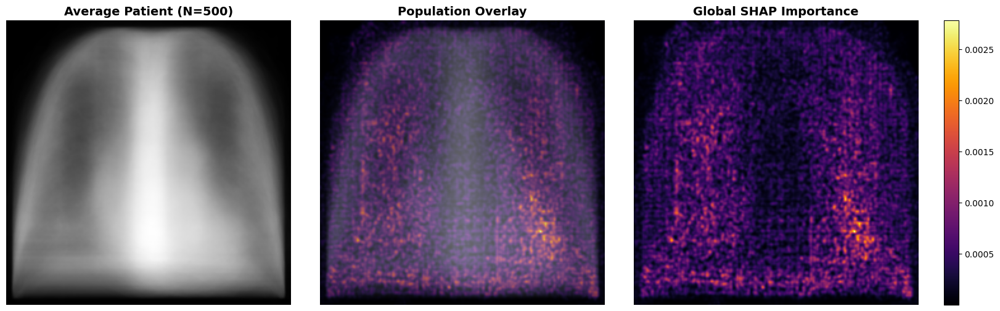

In [121]:
all_positive_preds = indices_dict['TP'] + indices_dict['FP']
print(f"Total Positive Predictions: {len(all_positive_preds)}")

generate_population_shap(all_positive_preds, dmerge_test, model, explainer, max_images=500, sigma=1, save_path="opacity_population_shap_global.png")

# Lesion

In [122]:
d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_chex_test = XRVCorrectionDataset(d_chex_raw)

### Swin-B - CAM

In [123]:
# Load the model
weights = models.Swin_B_Weights.IMAGENET1K_V1
model = models.swin_b(weights=weights)
model.head = nn.Linear(model.head.in_features, 1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = "/home/varrel/image_model_dict/final/fixed_swinb_lesion_model_epoch3.pth"
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

if 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
else:
    model.load_state_dict(checkpoint)

model = model.to(device)
model.eval()

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=512, out_features=128, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock

In [124]:
indices_dict = find_confusion_matrix_indices(d_chex_test, model, target_class="Lung Lesion", threshold=0.5, limit=10)

Scanning up to 2000 images to find 10 examples per category for 'Lung Lesion'...
Using column: 'Lung Lesion' for Ground Truth.


  1%|          | 196/19295 [00:01<02:35, 122.50it/s]

Found enough examples for all categories!

--- Scanning Complete ---
TP (True Pos):  [62, 119, 126, 127, 159, 167, 170, 193, 194, 195]
TN (True Neg):  [0, 1, 2, 3, 4, 5, 6, 7, 8, 10]
FP (False Pos): [9, 35, 51, 64, 65, 67, 118, 120, 150, 168]
FN (False Neg): [12, 34, 45, 46, 47, 49, 52, 54, 58, 60]


Saved viz_Positive_lesion.png


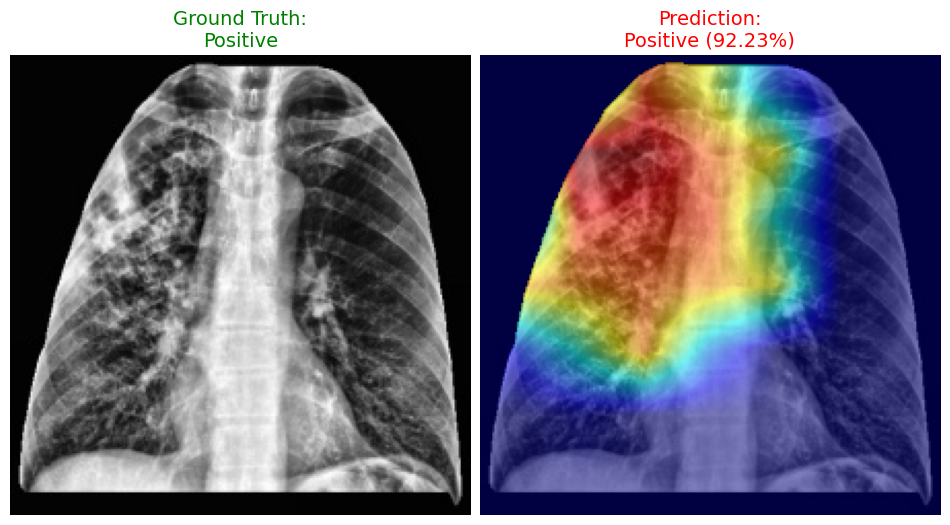

In [89]:
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

def reshape_transform(tensor):
    # Standard Swin-B output: (B, H, W, C) -> Permute to (B, C, H, W)
    if tensor.ndim == 4:
        return tensor.permute(0, 3, 1, 2)
    return tensor

# --- CONFIGURATION ---
INDEX = indices_dict['TP'][4]
DATASET = d_chex_test
TARGET_CLASS = "Lung Lesion"
FLIP_MODE = None

sample = DATASET[INDEX]
img_xrv = sample['img']

gt_text = "Unknown"
is_positive = False

if hasattr(DATASET, 'csv'):
    if 'Lung Lesion' in DATASET.csv.columns:
        val = DATASET.csv.iloc[INDEX]['Lung Lesion']
        if not np.isnan(val):
            is_positive = (int(val) == 1)
            gt_text = "Positive" if is_positive else "Negative"
            
    elif 'Finding Labels' in DATASET.csv.columns:
        label_text = DATASET.csv.iloc[INDEX]['Finding Labels']
        is_positive = TARGET_CLASS in label_text
        gt_text = "Positive" if is_positive else "Negative"

img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)

rgb_img = np.repeat(img_norm.transpose(1, 2, 0), 3, axis=2)

input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

with torch.no_grad():
    output = model(input_tensor)
    prob = torch.sigmoid(output).item()

if prob < 0.5:
    pred_text = f"Negative ({prob:.2%})"
    color_pred = 'blue'
else:
    pred_text = f"Positive ({prob:.2%})"
    color_pred = 'red'

target_layers = [model.norm]
cam = EigenCAM(
    model=model, 
    target_layers=target_layers, 
    reshape_transform=reshape_transform
)
grayscale_cam = cam(input_tensor=input_tensor, targets=[BinaryClassifierOutputTarget(0)])[0, :]

if FLIP_MODE == 'transpose':
    grayscale_cam = grayscale_cam.T
elif FLIP_MODE == 'left-right':
    grayscale_cam = np.fliplr(grayscale_cam)
elif FLIP_MODE == 'up-down':
    grayscale_cam = np.flipud(grayscale_cam)
elif FLIP_MODE == 'rotate-180':
    grayscale_cam = np.rot90(grayscale_cam, 2)

norm_image_uint8 = (img_norm[0] * 255).astype(np.uint8)
_, binary_mask = cv2.threshold(norm_image_uint8, 15, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    mask = filled_mask.astype(np.float32) / 255.0
else:
    mask = np.ones_like(img_norm[0])

masked_cam = grayscale_cam * mask
masked_cam = masked_cam - masked_cam.min()
if masked_cam.max() > 0:
    masked_cam = masked_cam / masked_cam.max()

viz_masked = show_cam_on_image(rgb_img, masked_cam, use_rgb=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace': 0.02})

axes[0].imshow(rgb_img)
axes[0].set_title(f"Ground Truth:\n{gt_text}", fontsize=14, 
                  color='green' if gt_text == "Positive" else 'black')
axes[0].axis('off')

axes[1].imshow(viz_masked)
axes[1].set_title(f"Prediction:\n{pred_text}", fontsize=14, 
                  color=color_pred)
axes[1].axis('off')

plt.subplots_adjust(wspace=0.02)
plt.savefig(f'viz_{gt_text}_lesion.png', dpi=300, bbox_inches='tight')
print(f"Saved viz_{gt_text}_lesion.png")
plt.show()

### Swin-B - SHAP

Background batch shape: torch.Size([50, 3, 224, 224])
Calculating SHAP for Index 159...
Saving to lesion_TP_SHAP.png...


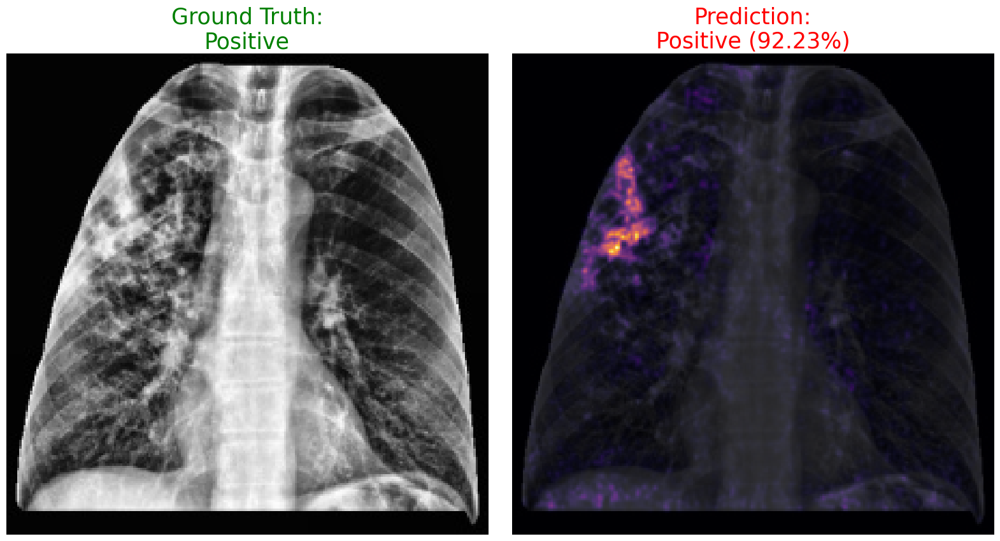

In [125]:
from torch.utils.data import DataLoader
loader = DataLoader(d_nih_test, batch_size=50, shuffle=True)

batch = next(iter(loader))
images = batch['img']
background_batch = images.repeat(1, 3, 1, 1).float().to(device)

print(f"Background batch shape: {background_batch.shape}")

explainer = shap.GradientExplainer(model, background_batch)
save_shap_positive_only(indices_dict['TP'][4], d_chex_test, model, explainer, sigma = 1, save_path="lesion_TP_SHAP.png", target_class="Lung Lesion")

### Swin-B - Population

In [126]:
pc_png_test = PNGFolderDataset(img_dir="/home/varrel/imaging/all_images/PC_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/pc_test_split_filtered.csv",
    id_col="ImageID"
)

vindr_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/test_dataset/VinDr_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/vin_test_split.csv", id_col="image_id")

openi_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/Openi_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/openi_test_split_filtered.csv", id_col="filename")

d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_raw = xrv.datasets.NIH_Dataset(
    imgpath="/home/varrel/imaging/all_images/NIH_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/nih_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_mimic_raw = xrv.datasets.MIMIC_Dataset(
    imgpath="/home/varrel/imaging/all_images/MIMIC_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/mimic_test_split_xrv.csv",
    metacsvpath="/home/varrel/imaging/all_images/MIMIC_dataset/mimic-cxr-2.0.0-metadata.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_test = XRVCorrectionDataset(d_nih_raw)
d_chex_test = XRVCorrectionDataset(d_chex_raw)
d_mimic_test = XRVCorrectionDataset(d_mimic_raw)

classes = ['Lung Lesion']

"""---- Create Lung Lesion Label for NIH Dataset (Selection) ---"""
# create NIH label (lung lesion) if not present
if "Lung Lesion" not in d_nih_test.pathologies:
    d_nih_test.pathologies.append("Lung Lesion")

mass_idx = d_nih_test.pathologies.index("Mass")
nodule_idx = d_nih_test.pathologies.index("Nodule")

# Original labels shape: (N, 14)
old_labels = d_nih_test.labels
N, old_len = old_labels.shape
new_len = len(d_nih_test.pathologies)

# Create new labels matrix with extra column
new_labels = np.zeros((N, new_len), dtype=old_labels.dtype)
new_labels[:, :old_len] = old_labels

# Fill Lung Lesion column as OR(Mass, Nodule)
lunglesion_idx = d_nih_test.pathologies.index("Lung Lesion")
new_labels[:, lunglesion_idx] = np.logical_or(
    old_labels[:, mass_idx] == 1,
    old_labels[:, nodule_idx] == 1
).astype(int)

# Replace dataset labels
d_nih_test.labels = new_labels

xrv.datasets.relabel_dataset(classes, d_chex_test)
xrv.datasets.relabel_dataset(classes, d_nih_test)
xrv.datasets.relabel_dataset(classes, d_mimic_test)
xrv.datasets.relabel_dataset(classes, pc_png_test)
xrv.datasets.relabel_dataset(classes, vindr_png_test)
xrv.datasets.relabel_dataset(classes, openi_png_test)

dmerge_test = xrv.datasets.MergeDataset([
    d_chex_test, d_nih_test, d_mimic_test, 
    pc_png_test, openi_png_test, vindr_png_test
])

{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'Pleural_Thickening', 'Effusion', 'Cardiomegaly', 'Emphysema', 'Hernia', 'Mass', 'Nodule', 'Pneumothorax', 'Fibrosis', 'Infiltration', 'Consolidation', 'Pneumonia', 'Atelectasis', 'Edema'} will be dropped
{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Atelectasis'), np.str_('Fracture'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'No Finding', 'Lung Opacity', 'Pneumonia', 'Pleural Effusion', 'Enlarged Cardio.', 'Cardiomegaly', 'Pneumothorax', 'Consolidation', 'Atelectasis', 'Fracture', 

In [127]:
indices_dict = find_tp_fp_indices(dmerge_test, model, threshold=0.5, target_class="Lung Lesion", limit=250, max_scan=70000)

Selecting 70000 RANDOM indices from 74494 total images...
Scanning to find 250 examples for TP and FP...


 15%|█▍        | 10433/70000 [00:43<04:09, 238.85it/s] 

Found enough examples for both TP and FP!

--- Scanning Complete ---
TP (True Pos):  250 found
FP (False Pos): 250 found


Total Positive Predictions: 500
Generating Smoothed Global SHAP Map for 500 images...


100%|██████████| 500/500 [07:48<00:00,  1.07it/s]


Applying Gaussian Smoothing (sigma=1)...
Saving to lesion_population_shap_global.png...


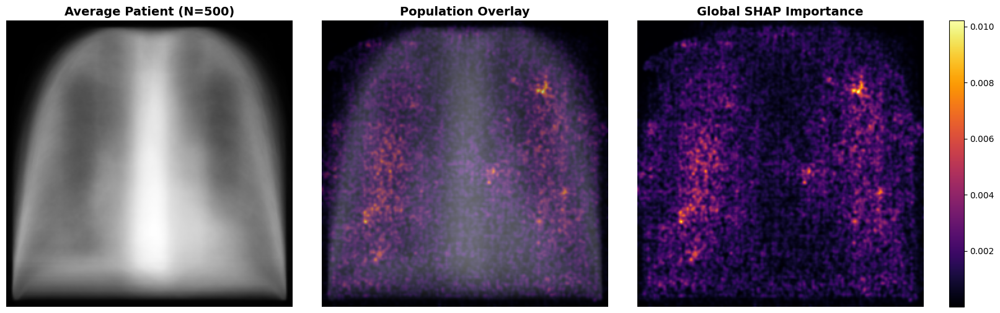

In [128]:
all_positive_preds = indices_dict['TP'] + indices_dict['FP']
print(f"Total Positive Predictions: {len(all_positive_preds)}")

generate_population_shap(all_positive_preds, dmerge_test, model, explainer, max_images=500, sigma=1, save_path="lesion_population_shap_global.png")

# Fracture

In [92]:
d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_chex_test = XRVCorrectionDataset(d_chex_raw)

### Swin-B - CAM

In [93]:
# Load the model
weights = models.Swin_B_Weights.IMAGENET1K_V1
model = models.swin_b(weights=weights)
model.head = nn.Linear(model.head.in_features, 1)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = "/home/varrel/image_model_dict/final/fixed_swinb_fracture_model_epoch1.pth"
checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)

if 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
else:
    model.load_state_dict(checkpoint)

model = model.to(device)
model.eval()

SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=512, out_features=128, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock

In [94]:
indices_dict = find_confusion_matrix_indices(d_chex_test, model, target_class="Fracture", threshold=0.6, limit=10)

Scanning up to 2000 images to find 10 examples per category for 'Fracture'...
Using column: 'Fracture' for Ground Truth.


  1%|          | 108/19295 [00:00<02:27, 130.33it/s]

Found enough examples for all categories!

--- Scanning Complete ---
TP (True Pos):  [6, 7, 9, 10, 11, 12, 13, 14, 22, 25]
TN (True Neg):  [0, 3, 4, 5, 8, 15, 16, 17, 18, 19]
FP (False Pos): [1, 2, 24, 30, 38, 42, 48, 51, 53, 56]
FN (False Neg): [34, 35, 37, 41, 44, 80, 88, 103, 106, 107]


Saved viz_Positive_fracture.png


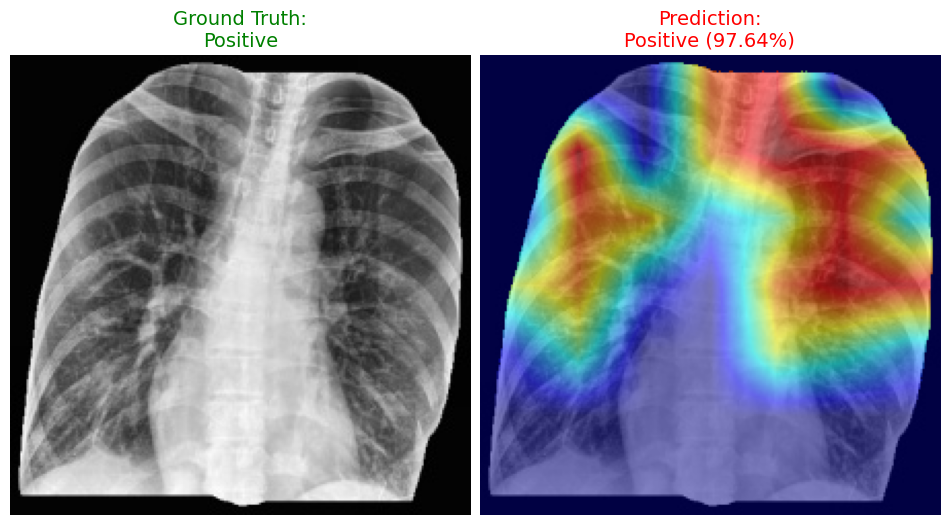

In [99]:
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget

def reshape_transform(tensor):
    # Standard Swin-B output: (B, H, W, C) -> Permute to (B, C, H, W)
    if tensor.ndim == 4:
        return tensor.permute(0, 3, 1, 2)
    return tensor

# --- CONFIGURATION ---
INDEX = indices_dict['TP'][6]
DATASET = d_chex_test
TARGET_CLASS = "Fracture"
FLIP_MODE = None

# 1. Load Data
sample = DATASET[INDEX]
img_xrv = sample['img']

gt_text = "Unknown"
is_positive = False

if hasattr(DATASET, 'csv'):
    if 'Fracture' in DATASET.csv.columns:
        val = DATASET.csv.iloc[INDEX]['Fracture']
        if not np.isnan(val):
            is_positive = (int(val) == 1)
            gt_text = "Positive" if is_positive else "Negative"
            
    elif 'Finding Labels' in DATASET.csv.columns:
        label_text = DATASET.csv.iloc[INDEX]['Finding Labels']
        is_positive = TARGET_CLASS in label_text
        gt_text = "Positive" if is_positive else "Negative"

img_norm = (img_xrv - img_xrv.min()) / (img_xrv.max() - img_xrv.min())
if img_norm.ndim == 2: img_norm = np.expand_dims(img_norm, axis=0)

rgb_img = np.repeat(img_norm.transpose(1, 2, 0), 3, axis=2)

input_tensor = torch.from_numpy(img_norm).unsqueeze(0).repeat(1, 3, 1, 1).float().to(device)

with torch.no_grad():
    output = model(input_tensor)
    prob = torch.sigmoid(output).item()

if prob < 0.5:
    pred_text = f"Negative ({prob:.2%})"
    color_pred = 'blue'
else:
    pred_text = f"Positive ({prob:.2%})"
    color_pred = 'red'

target_layers = [model.norm]
cam = EigenCAM(
    model=model, 
    target_layers=target_layers, 
    reshape_transform=reshape_transform
)
grayscale_cam = cam(input_tensor=input_tensor, targets=[BinaryClassifierOutputTarget(0)])[0, :]

if FLIP_MODE == 'transpose':
    grayscale_cam = grayscale_cam.T
elif FLIP_MODE == 'left-right':
    grayscale_cam = np.fliplr(grayscale_cam)
elif FLIP_MODE == 'up-down':
    grayscale_cam = np.flipud(grayscale_cam)
elif FLIP_MODE == 'rotate-180':
    grayscale_cam = np.rot90(grayscale_cam, 2)

norm_image_uint8 = (img_norm[0] * 255).astype(np.uint8)
_, binary_mask = cv2.threshold(norm_image_uint8, 15, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    filled_mask = np.zeros_like(binary_mask)
    cv2.drawContours(filled_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    mask = filled_mask.astype(np.float32) / 255.0
else:
    mask = np.ones_like(img_norm[0])

masked_cam = grayscale_cam * mask
masked_cam = masked_cam - masked_cam.min()
if masked_cam.max() > 0:
    masked_cam = masked_cam / masked_cam.max()

viz_masked = show_cam_on_image(rgb_img, masked_cam, use_rgb=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'wspace': 0.02})

axes[0].imshow(rgb_img)
axes[0].set_title(f"Ground Truth:\n{gt_text}", fontsize=14, 
                  color='green' if gt_text == "Positive" else 'black')
axes[0].axis('off')

axes[1].imshow(viz_masked)
axes[1].set_title(f"Prediction:\n{pred_text}", fontsize=14, 
                  color=color_pred)
axes[1].axis('off')

plt.subplots_adjust(wspace=0.02)
plt.savefig(f'viz_{gt_text}_fracture.png', dpi=300, bbox_inches='tight')
print(f"Saved viz_{gt_text}_fracture.png")
plt.show()

### Swin-B - SHAP

Background batch shape: torch.Size([50, 3, 224, 224])
Calculating SHAP for Index 13...
Saving to fracture_TP_SHAP.png...


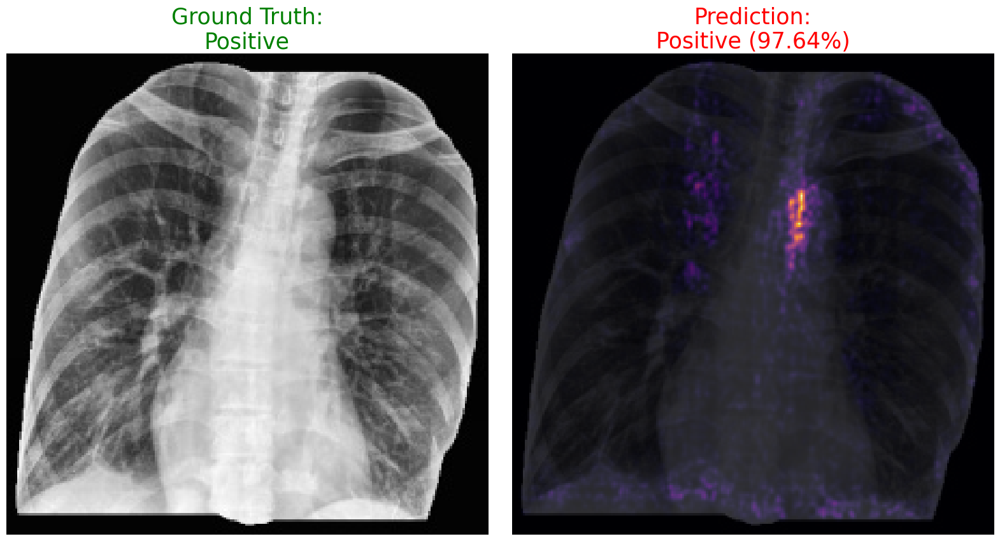

In [95]:
from torch.utils.data import DataLoader
loader = DataLoader(d_nih_test, batch_size=50, shuffle=True)

batch = next(iter(loader))
images = batch['img']
background_batch = images.repeat(1, 3, 1, 1).float().to(device)

print(f"Background batch shape: {background_batch.shape}")

explainer = shap.GradientExplainer(model, background_batch)
save_shap_positive_only(indices_dict['TP'][6], d_chex_test, model, explainer, sigma = 1, save_path="fracture_TP_SHAP.png", target_class="Fracture")

### Swin-B - Population

In [96]:
pc_png_test = PNGFolderDataset(img_dir="/home/varrel/imaging/all_images/PC_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/pc_test_split_filtered.csv",
    id_col="ImageID"
)

vindr_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/test_dataset/VinDr_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/vin_test_split.csv", id_col="image_id")

openi_png_test = PNGFolderDataset(
    img_dir="/home/varrel/test_images/Openi_dataset/images_all/preprocess7",
    csv_path="/home/varrel/GitHub/CXR-Analysis/final_csv/openi_test_split_filtered.csv", id_col="filename")

d_chex_raw = xrv.datasets.CheX_Dataset(
    imgpath="/home/varrel/imaging/all_images/CheX_dataset/images_all/CheXpert-v1.0/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/train_chex_test_split_xrv.csv",
    views=["PA","AP"], unique_patients=False)

d_mimic_raw = xrv.datasets.MIMIC_Dataset(
    imgpath="/home/varrel/imaging/all_images/MIMIC_dataset/images_all/preprocess7",
    csvpath="/home/varrel/GitHub/CXR-Analysis/final_csv/mimic_test_split_xrv.csv",
    metacsvpath="/home/varrel/imaging/all_images/MIMIC_dataset/mimic-cxr-2.0.0-metadata.csv",
    views=["PA","AP"], unique_patients=False)

d_nih_test = XRVCorrectionDataset(d_nih_raw)
d_chex_test = XRVCorrectionDataset(d_chex_raw)
d_mimic_test = XRVCorrectionDataset(d_mimic_raw)

classes = ['Fracture']

xrv.datasets.relabel_dataset(classes, d_chex_test)
xrv.datasets.relabel_dataset(classes, d_mimic_test)
xrv.datasets.relabel_dataset(classes, pc_png_test)
xrv.datasets.relabel_dataset(classes, vindr_png_test)
xrv.datasets.relabel_dataset(classes, openi_png_test)

dmerge_test = xrv.datasets.MergeDataset([
    d_chex_test, d_mimic_test, 
    pc_png_test, openi_png_test, vindr_png_test
])

{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{np.str_('Pneumonia'), np.str_('Lung Opacity'), np.str_('Effusion'), np.str_('Cardiomegaly'), np.str_('Pneumothorax'), np.str_('Enlarged Cardiomediastinum'), np.str_('Consolidation'), np.str_('Lung Lesion'), np.str_('Atelectasis'), np.str_('Edema'), np.str_('Pleural Other'), np.str_('Support Devices')} will be dropped
{'No Finding', 'Lung Opacity', 'Pneumonia', 'Pleural Effusion', 'Enlarged Cardio.', 'Cardiomegaly', 'Pneumothorax', 'Consolidation', 'Lung Lesion', 'Atelectasis', 'Edema', 'Support Devices'} will be dropped
{'No Finding', 'Lung Opacity', 'Pneumonia', 'Pleural Effusion', 'Cardiomegaly', 'Pneumothorax', 'Consolidation', 'Lung Lesion', 'Atelectasis', 'Edema'} w

In [99]:
indices_dict = find_tp_fp_indices(dmerge_test, model, threshold=0.60, target_class="Fracture", limit=250, max_scan=70000)

Selecting 63433 RANDOM indices from 63433 total images...
Scanning to find 250 examples for TP and FP...


  6%|▋         | 4023/63433 [01:16<18:46, 52.74it/s] 

Found enough examples for both TP and FP!

--- Scanning Complete ---
TP (True Pos):  250 found
FP (False Pos): 250 found


Total Positive Predictions: 500
Generating Smoothed Global SHAP Map for 500 images...


100%|██████████| 500/500 [07:48<00:00,  1.07it/s]


Applying Gaussian Smoothing (sigma=1)...
Saving to fracture_population_shap_global.png...


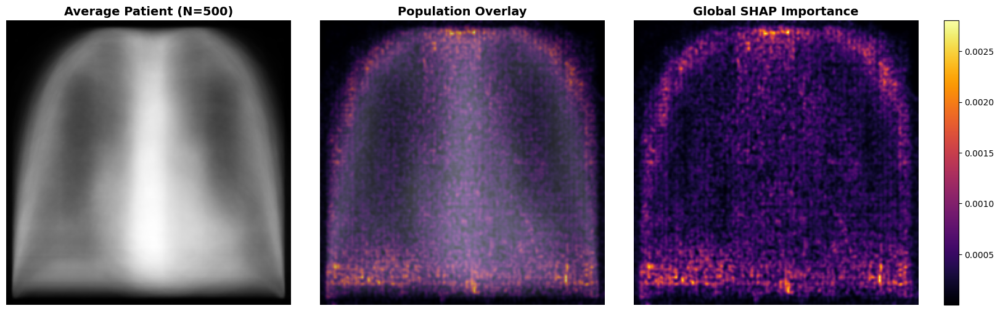

In [100]:
all_positive_preds = indices_dict['TP'] + indices_dict['FP']
print(f"Total Positive Predictions: {len(all_positive_preds)}")

generate_population_shap(all_positive_preds, dmerge_test, model, explainer, max_images=500, sigma=1, save_path="fracture_population_shap_global.png")